In [225]:
import warnings
warnings.filterwarnings("ignore")

# Wrangling
import pandas as pd
import numpy as np
from sklearn.model_selection import train_test_split
import acquire
from scipy import stats
import sklearn.preprocessing
from sklearn.feature_selection import SelectKBest, f_regression
from sklearn.feature_selection import RFE
# modeling methods
from sklearn.metrics import mean_squared_error
from sklearn.linear_model import LinearRegression, LassoLars, TweedieRegressor
from sklearn.preprocessing import PolynomialFeatures
from sklearn.cluster import KMeans

np.random.seed(123)

# Visualizing
%matplotlib inline
import matplotlib.pyplot as plt
import seaborn as sns

In [121]:
# Pasting a code I found from itertools documentation.

def combinations(iterable, r):
    # combinations('ABCD', 2) --> AB AC AD BC BD CD
    # combinations(range(4), 3) --> 012 013 023 123
    pool = tuple(iterable)
    n = len(pool)
    if r > n:
        return
    indices = list(range(r))
    yield tuple(pool[i] for i in indices)
    while True:
        for i in reversed(range(r)):
            if indices[i] != i + n - r:
                break
        else:
            return
        indices[i] += 1
        for j in range(i+1, r):
            indices[j] = indices[j-1] + 1
        yield tuple(pool[i] for i in indices)

In [474]:
zillow = acquire.get_zillow_data()

In [515]:
# Get a peek of the dataframe
zillow.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 77474 entries, 0 to 77573
Data columns (total 29 columns):
 #   Column                        Non-Null Count  Dtype  
---  ------                        --------------  -----  
 0   id                            77474 non-null  int64  
 1   parcelid                      77474 non-null  int64  
 2   bathroomcnt                   77474 non-null  float64
 3   bedroomcnt                    77474 non-null  float64
 4   calculatedbathnbr             76959 non-null  float64
 5   calculatedfinishedsquarefeet  77373 non-null  float64
 6   finishedsquarefeet12          73919 non-null  float64
 7   fips                          77474 non-null  float64
 8   fullbathcnt                   76959 non-null  float64
 9   latitude                      77474 non-null  float64
 10  longitude                     77474 non-null  float64
 11  lotsizesquarefeet             69300 non-null  float64
 12  propertycountylandusecode     77474 non-null  object 
 13  p

In [476]:
# Create a function that will remove rows and columns that have missing values past a certain threshold.
def handle_missing_values(df, p_row = 0.84, p_col = 0.84):
    ''' function which takes in a dataframe, required notnull proportions of non-null rows and columns.
    drop the columns and rows columns based on theshold:'''
    
    #drop columns with nulls
    threshold = int(p_col * len(df.index)) # Require that many non-NA values.
    df.dropna(axis = 1, thresh = threshold, inplace = True)
    
    #drop rows with nulls
    threshold = int(p_row * len(df.columns)) # Require that many non-NA values.
    df.dropna(axis = 0, thresh = threshold, inplace = True)
    
    
    return df

In [477]:
b = handle_missing_values(zillow)

In [478]:
b.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 77474 entries, 0 to 77573
Data columns (total 29 columns):
 #   Column                        Non-Null Count  Dtype  
---  ------                        --------------  -----  
 0   id                            77474 non-null  int64  
 1   parcelid                      77474 non-null  int64  
 2   bathroomcnt                   77474 non-null  float64
 3   bedroomcnt                    77474 non-null  float64
 4   calculatedbathnbr             76959 non-null  float64
 5   calculatedfinishedsquarefeet  77373 non-null  float64
 6   finishedsquarefeet12          73919 non-null  float64
 7   fips                          77474 non-null  float64
 8   fullbathcnt                   76959 non-null  float64
 9   latitude                      77474 non-null  float64
 10  longitude                     77474 non-null  float64
 11  lotsizesquarefeet             69300 non-null  float64
 12  propertycountylandusecode     77474 non-null  object 
 13  p

In [7]:
# Remove observations where bedroom and bathroom counts are zero.
b = b[b.bedroomcnt != 0]
b = b[b.bathroomcnt !=0]

In [8]:
b.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 76720 entries, 0 to 77573
Data columns (total 29 columns):
 #   Column                        Non-Null Count  Dtype  
---  ------                        --------------  -----  
 0   id                            76720 non-null  int64  
 1   parcelid                      76720 non-null  int64  
 2   bathroomcnt                   76720 non-null  float64
 3   bedroomcnt                    76720 non-null  float64
 4   calculatedbathnbr             76703 non-null  float64
 5   calculatedfinishedsquarefeet  76709 non-null  float64
 6   finishedsquarefeet12          73560 non-null  float64
 7   fips                          76720 non-null  float64
 8   fullbathcnt                   76703 non-null  float64
 9   latitude                      76720 non-null  float64
 10  longitude                     76720 non-null  float64
 11  lotsizesquarefeet             68569 non-null  float64
 12  propertycountylandusecode     76720 non-null  object 
 13  p

In [479]:
# Take a look at the amount of missing values.
b.isnull().sum()

id                                 0
parcelid                           0
bathroomcnt                        0
bedroomcnt                         0
calculatedbathnbr                515
calculatedfinishedsquarefeet     101
finishedsquarefeet12            3555
fips                               0
fullbathcnt                      515
latitude                           0
longitude                          0
lotsizesquarefeet               8174
propertycountylandusecode          0
propertylandusetypeid              0
rawcensustractandblock             0
regionidcity                    1460
regionidcounty                     0
regionidzip                       45
roomcnt                            0
yearbuilt                        169
structuretaxvaluedollarcnt        99
taxvaluedollarcnt                  1
assessmentyear                     0
landtaxvaluedollarcnt              1
taxamount                          5
censustractandblock              226
logerror                           0
t

In [480]:
# Create a list of columns to drop.
columns_to_drop = ['calculatedbathnbr','finishedsquarefeet12','id','transactiondate','parcelid','fullbathcnt','propertycountylandusecode','propertylandusetypeid','rawcensustractandblock','regionidcity','regionidcounty','regionidzip','censustractandblock','propertylandusedesc']

In [481]:
# Create a function that will drop unwanted columns.
def drop_columns(df, drop_col):
    df = df.drop(columns=drop_col)
    return df

In [482]:
b = drop_columns(b, columns_to_drop)

In [483]:
b.isna().sum()

bathroomcnt                        0
bedroomcnt                         0
calculatedfinishedsquarefeet     101
fips                               0
latitude                           0
longitude                          0
lotsizesquarefeet               8174
roomcnt                            0
yearbuilt                        169
structuretaxvaluedollarcnt        99
taxvaluedollarcnt                  1
assessmentyear                     0
landtaxvaluedollarcnt              1
taxamount                          5
logerror                           0
dtype: int64

### There are a few more columns with missing values that I will impute after I split.

In [484]:
# split test off, 20% of original df size. 
train_validate, test = train_test_split(b, test_size=.2, 
                                        random_state=42)

# split validate off, 30% of what remains (24% of original df size)
# thus train will be 56% of original df size. 
train, validate = train_test_split(train_validate, test_size=.3, 
                                   random_state=42)

print("train observations: ", train.shape)
print("validate observations: ", validate.shape)
print("test observations: ", test.shape)

train observations:  (43385, 15)
validate observations:  (18594, 15)
test observations:  (15495, 15)


In [485]:
train.isnull().sum()

bathroomcnt                        0
bedroomcnt                         0
calculatedfinishedsquarefeet      56
fips                               0
latitude                           0
longitude                          0
lotsizesquarefeet               4553
roomcnt                            0
yearbuilt                         92
structuretaxvaluedollarcnt        53
taxvaluedollarcnt                  1
assessmentyear                     0
landtaxvaluedollarcnt              1
taxamount                          0
logerror                           0
dtype: int64

In [16]:
train.head()

,bathroomcnt,bedroomcnt,calculatedfinishedsquarefeet,fips,latitude,longitude,lotsizesquarefeet,roomcnt,yearbuilt,structuretaxvaluedollarcnt,taxvaluedollarcnt,assessmentyear,landtaxvaluedollarcnt,taxamount,logerror
45257,1.0,2.0,1148.0,6037.0,34119962.0,-118217185.0,6019.0,0.0,1922.0,110662.0,553311.0,2016.0,442649.0,6724.25,-0.307749
54021,2.0,2.0,898.0,6037.0,34113215.0,-118216168.0,6422.0,0.0,1947.0,150127.0,600517.0,2016.0,450390.0,7192.46,-0.123643
71314,1.0,1.0,1010.0,6037.0,34762455.0,-118274177.0,99411.0,0.0,1948.0,64420.0,88779.0,2016.0,24359.0,4153.06,-0.002535
8173,2.0,3.0,1218.0,6037.0,33984328.0,-118319988.0,4802.0,0.0,1923.0,66000.0,334000.0,2016.0,268000.0,4062.89,-0.045101
20821,1.0,1.0,835.0,6037.0,34410700.0,-118561000.0,842267.0,0.0,1989.0,141531.0,211532.0,2016.0,70001.0,3470.57,0.014981


In [17]:
validate.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 18413 entries, 60132 to 47760
Data columns (total 15 columns):
 #   Column                        Non-Null Count  Dtype  
---  ------                        --------------  -----  
 0   bathroomcnt                   18413 non-null  float64
 1   bedroomcnt                    18413 non-null  float64
 2   calculatedfinishedsquarefeet  18408 non-null  float64
 3   fips                          18413 non-null  float64
 4   latitude                      18413 non-null  float64
 5   longitude                     18413 non-null  float64
 6   lotsizesquarefeet             16443 non-null  float64
 7   roomcnt                       18413 non-null  float64
 8   yearbuilt                     18397 non-null  float64
 9   structuretaxvaluedollarcnt    18387 non-null  float64
 10  taxvaluedollarcnt             18413 non-null  float64
 11  assessmentyear                18413 non-null  float64
 12  landtaxvaluedollarcnt         18413 non-null  float64
 1

In [18]:
test.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 15344 entries, 49243 to 4021
Data columns (total 15 columns):
 #   Column                        Non-Null Count  Dtype  
---  ------                        --------------  -----  
 0   bathroomcnt                   15344 non-null  float64
 1   bedroomcnt                    15344 non-null  float64
 2   calculatedfinishedsquarefeet  15341 non-null  float64
 3   fips                          15344 non-null  float64
 4   latitude                      15344 non-null  float64
 5   longitude                     15344 non-null  float64
 6   lotsizesquarefeet             13786 non-null  float64
 7   roomcnt                       15344 non-null  float64
 8   yearbuilt                     15334 non-null  float64
 9   structuretaxvaluedollarcnt    15332 non-null  float64
 10  taxvaluedollarcnt             15344 non-null  float64
 11  assessmentyear                15344 non-null  float64
 12  landtaxvaluedollarcnt         15344 non-null  float64
 13

In [486]:
# use KNN imputer to fill missing values. 
from sklearn.impute import KNNImputer

# Quantitative columns used for imputation.
X_quant = train[['calculatedfinishedsquarefeet', 'lotsizesquarefeet', 'yearbuilt','structuretaxvaluedollarcnt','taxvaluedollarcnt', 'landtaxvaluedollarcnt']]

# Define the imputer.
imputer = KNNImputer(n_neighbors=10)

# Fit the imputer on the train dataset. This method will transform it as well.
train_imputed = imputer.fit_transform(X_quant)


In [487]:
# Check if imputed column has any null values.
pd.DataFrame(train_imputed).isnull().sum()

0    0
1    0
2    0
3    0
4    0
5    0
dtype: int64

In [488]:
# Convert imputed array to a dataframe
train_imputed = pd.DataFrame(train_imputed, index = train.index)
train_imputed.head()

,0,1,2,3,4,5
12706,1320.0,1320.0,1969.0,86268.0,405974.0,319706.0
38400,1222.0,6160.0,1955.0,40913.0,192672.0,151759.0
75067,1379.0,204377.0,1963.0,451786.0,756361.0,304575.0
68921,2525.0,3870.0,2001.0,241231.0,827929.0,586698.0
14454,2224.0,6300.0,2003.0,183685.0,209317.0,25632.0


In [489]:
# Assign imputed values to the original columns.
train[['calculatedfinishedsquarefeet', 'lotsizesquarefeet', 'yearbuilt', 'structuretaxvaluedollarcnt', 'taxvaluedollarcnt', 'landtaxvaluedollarcnt']] = train_imputed

In [490]:
train.head()

,bathroomcnt,bedroomcnt,calculatedfinishedsquarefeet,fips,latitude,longitude,lotsizesquarefeet,roomcnt,yearbuilt,structuretaxvaluedollarcnt,taxvaluedollarcnt,assessmentyear,landtaxvaluedollarcnt,taxamount,logerror
12706,2.5,3.0,1320.0,6059.0,33710230.0,-117935354.0,1320.0,6.0,1969.0,86268.0,405974.0,2016.0,319706.0,4652.76,0.127101
38400,2.0,4.0,1222.0,6037.0,34130087.0,-117843478.0,6160.0,0.0,1955.0,40913.0,192672.0,2016.0,151759.0,454.71,0.005248
75067,2.0,2.0,1379.0,6037.0,34039700.0,-118553000.0,204377.0,0.0,1963.0,451786.0,756361.0,2016.0,304575.0,9125.75,-0.009024
68921,2.5,3.0,2525.0,6059.0,33720191.0,-117772388.0,3870.0,0.0,2001.0,241231.0,827929.0,2016.0,586698.0,10760.92,2.332701
14454,3.0,4.0,2224.0,6059.0,33786589.0,-118021260.0,6300.0,6.0,2003.0,183685.0,209317.0,2016.0,25632.0,3031.82,0.437268


In [491]:
# do the transformation on validate and test
validate_imputed = imputer.transform(validate[['calculatedfinishedsquarefeet', 'lotsizesquarefeet', 'yearbuilt', 'structuretaxvaluedollarcnt', 'taxvaluedollarcnt', 'landtaxvaluedollarcnt']])
test_imputed = imputer.transform(test[['calculatedfinishedsquarefeet', 'lotsizesquarefeet', 'yearbuilt', 'structuretaxvaluedollarcnt', 'taxvaluedollarcnt', 'landtaxvaluedollarcnt']])

In [492]:
validate.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 18594 entries, 12168 to 6901
Data columns (total 15 columns):
 #   Column                        Non-Null Count  Dtype  
---  ------                        --------------  -----  
 0   bathroomcnt                   18594 non-null  float64
 1   bedroomcnt                    18594 non-null  float64
 2   calculatedfinishedsquarefeet  18572 non-null  float64
 3   fips                          18594 non-null  float64
 4   latitude                      18594 non-null  float64
 5   longitude                     18594 non-null  float64
 6   lotsizesquarefeet             16597 non-null  float64
 7   roomcnt                       18594 non-null  float64
 8   yearbuilt                     18559 non-null  float64
 9   structuretaxvaluedollarcnt    18568 non-null  float64
 10  taxvaluedollarcnt             18594 non-null  float64
 11  assessmentyear                18594 non-null  float64
 12  landtaxvaluedollarcnt         18594 non-null  float64
 13

In [493]:
# convert arrays from above into dataframes
validate_imputed = pd.DataFrame(validate_imputed, index = validate.index)
test_imputed = pd.DataFrame(test_imputed, index = test.index)

In [494]:
# assign imputed values to columns for validate and test dataframes
validate[['calculatedfinishedsquarefeet', 'lotsizesquarefeet', 'yearbuilt', 'structuretaxvaluedollarcnt', 'taxvaluedollarcnt', 'landtaxvaluedollarcnt']] = validate_imputed
test[['calculatedfinishedsquarefeet', 'lotsizesquarefeet', 'yearbuilt', 'structuretaxvaluedollarcnt', 'taxvaluedollarcnt', 'landtaxvaluedollarcnt']] = test_imputed

In [495]:
# Check to make sure all dataframes have no missing values.
validate.info(), test.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 18594 entries, 12168 to 6901
Data columns (total 15 columns):
 #   Column                        Non-Null Count  Dtype  
---  ------                        --------------  -----  
 0   bathroomcnt                   18594 non-null  float64
 1   bedroomcnt                    18594 non-null  float64
 2   calculatedfinishedsquarefeet  18594 non-null  float64
 3   fips                          18594 non-null  float64
 4   latitude                      18594 non-null  float64
 5   longitude                     18594 non-null  float64
 6   lotsizesquarefeet             18594 non-null  float64
 7   roomcnt                       18594 non-null  float64
 8   yearbuilt                     18594 non-null  float64
 9   structuretaxvaluedollarcnt    18594 non-null  float64
 10  taxvaluedollarcnt             18594 non-null  float64
 11  assessmentyear                18594 non-null  float64
 12  landtaxvaluedollarcnt         18594 non-null  float64
 13

(None, None)

In [496]:
# Remove remaining missing values.
validate.dropna(inplace=True)
test.dropna(inplace=True)

In [497]:
# Check to make sure all dataframes have no missing values.
validate.info(), test.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 18592 entries, 12168 to 6901
Data columns (total 15 columns):
 #   Column                        Non-Null Count  Dtype  
---  ------                        --------------  -----  
 0   bathroomcnt                   18592 non-null  float64
 1   bedroomcnt                    18592 non-null  float64
 2   calculatedfinishedsquarefeet  18592 non-null  float64
 3   fips                          18592 non-null  float64
 4   latitude                      18592 non-null  float64
 5   longitude                     18592 non-null  float64
 6   lotsizesquarefeet             18592 non-null  float64
 7   roomcnt                       18592 non-null  float64
 8   yearbuilt                     18592 non-null  float64
 9   structuretaxvaluedollarcnt    18592 non-null  float64
 10  taxvaluedollarcnt             18592 non-null  float64
 11  assessmentyear                18592 non-null  float64
 12  landtaxvaluedollarcnt         18592 non-null  float64
 13

(None, None)

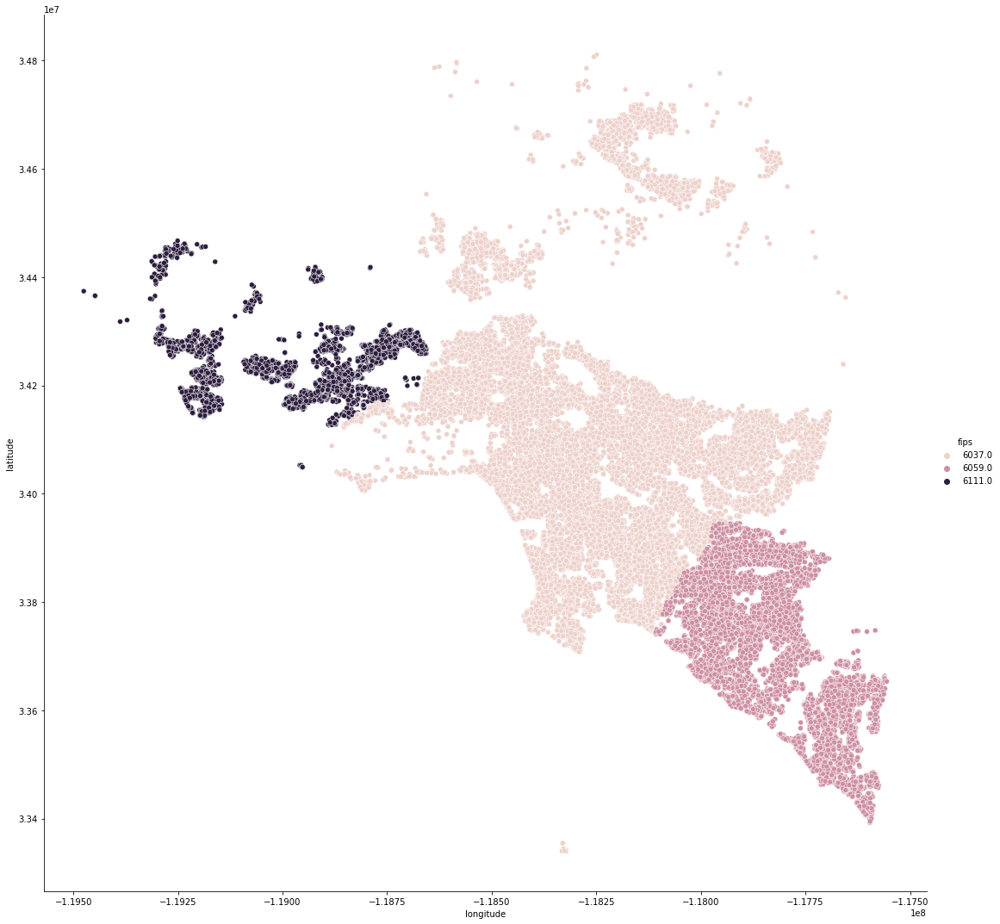

In [30]:
#plt.figure(figsize=(10,16))

sns.relplot(train.longitude, train.latitude, hue=train.fips, height=15)

# Takeaway
* Initially I thought logerror would vary noticeably depending on the latitude and longitude. But, the logerror seems to be uniform all throughout the landscape.
* Maybe if I bin logerror I can get a better visualization.

In [498]:
# Create a bunch of bins for logerror to see if it will help with visualzing logerror when plotted on top of longitude vs latitude
train['logerror_bin'] = pd.cut(train.logerror, bins=np.arange(train.logerror.min(),train.logerror.max(),step=1.5))

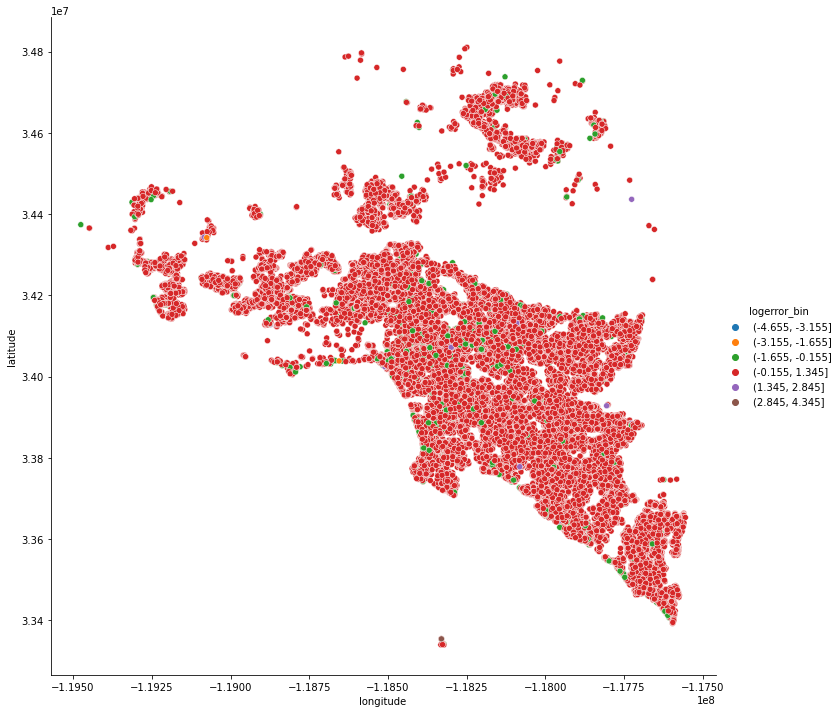

In [32]:
sns.relplot(train.longitude, train.latitude, hue=train.logerror_bin, height=10)

# Takeaways
* Binning the logerror made some of the observations stand out a little more, but I can't see any patterns as of now.
* Just call me Dora because I am about to...

### Explore!

### Target Variable: logerror
#### What will all our features look like plotted against the target (and everything else)?

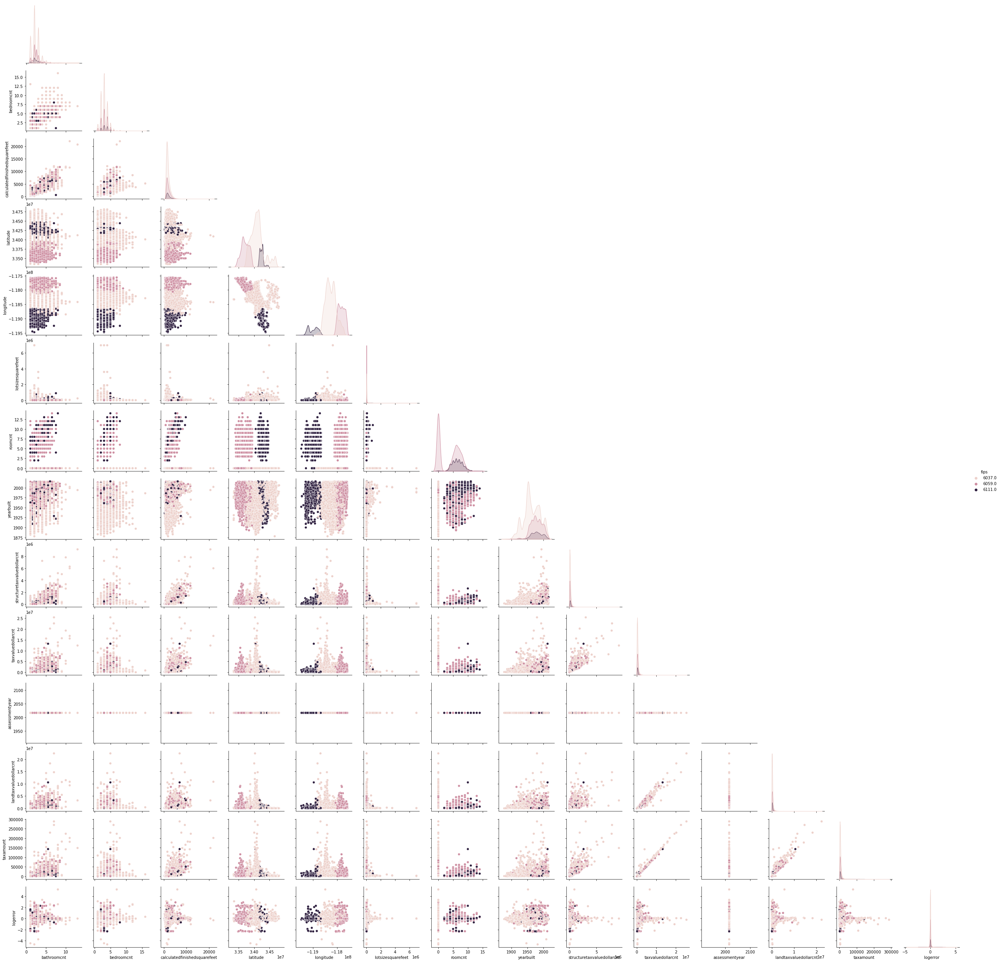

In [33]:
sns.pairplot(train, corner=True, hue='fips')

*** Create a function that will remove the target, iterate through a list of independent variables creating a list of the maximum combination of triplets.
-> Use the rfe_regressor to get the top 4 triplets that drives logerror

Text(0.5, 0, 'land_area')

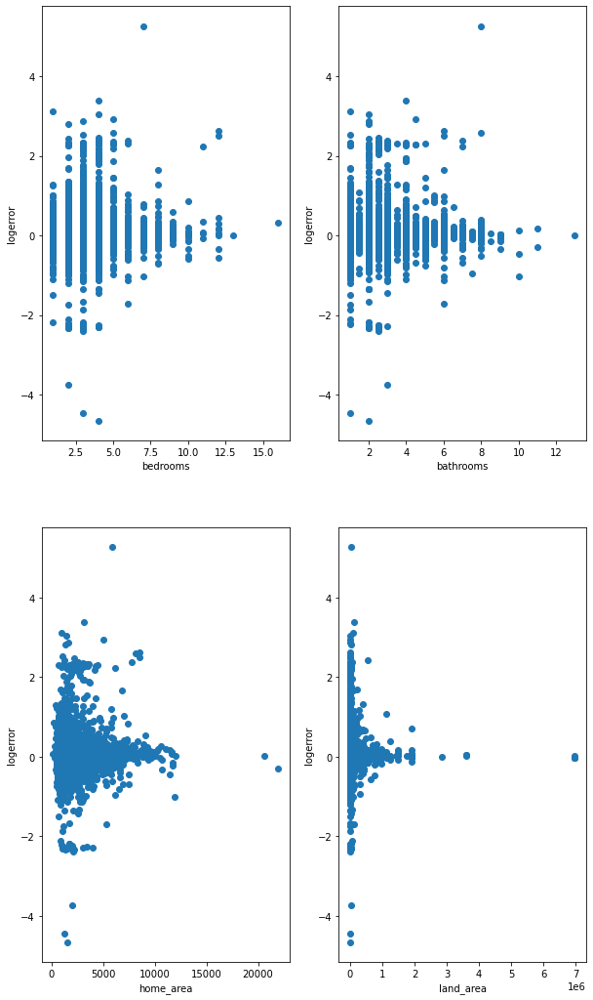

In [34]:
plt.figure(figsize=(10, 18))

plt.subplot(221)
plt.scatter(train.bedroomcnt, train.logerror)
plt.ylabel('logerror')
plt.xlabel('bedrooms')

plt.subplot(222)
plt.scatter(train.bathroomcnt, train.logerror)
plt.ylabel('logerror')
plt.xlabel('bathrooms')

plt.subplot(223)
plt.scatter(train.calculatedfinishedsquarefeet, train.logerror)
plt.ylabel('logerror')
plt.xlabel('home_area')

plt.subplot(224)
plt.scatter(train.lotsizesquarefeet, train.logerror)
plt.ylabel('logerror')
plt.xlabel('land_area')

In [35]:
train.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 42963 entries, 45257 to 9184
Data columns (total 16 columns):
 #   Column                        Non-Null Count  Dtype   
---  ------                        --------------  -----   
 0   bathroomcnt                   42963 non-null  float64 
 1   bedroomcnt                    42963 non-null  float64 
 2   calculatedfinishedsquarefeet  42963 non-null  float64 
 3   fips                          42963 non-null  float64 
 4   latitude                      42963 non-null  float64 
 5   longitude                     42963 non-null  float64 
 6   lotsizesquarefeet             42963 non-null  float64 
 7   roomcnt                       42963 non-null  float64 
 8   yearbuilt                     42963 non-null  float64 
 9   structuretaxvaluedollarcnt    42963 non-null  float64 
 10  taxvaluedollarcnt             42963 non-null  float64 
 11  assessmentyear                42963 non-null  float64 
 12  landtaxvaluedollarcnt         42963 non-nul

# Takeaways

* There doesn't seem to be any linear trend when plotting the independent variable against our target.
* There is a large variance in logerror among the lower end of the sepctrum across all variables.
* Small land area seems to have higher logerror.

### Scale the data

In [499]:
# Create a scaler object using the MinMaxScaler
scaler = sklearn.preprocessing.MinMaxScaler()

# Fit the scaler on the train dataset
# Use the select_dtypes to avoid an error when it tries to fit on the datetime datatype
scaler.fit(train.select_dtypes(include='float'))

# Use the scaler to transform the datasets
# Use the select_dtypes to avoid an error when it tries to transform on the datetime datatype
train_scaled = scaler.transform(train.select_dtypes(include='float'))
validate_scaled = scaler.transform(validate.select_dtypes(include='float'))
test_scaled = scaler.transform(test.select_dtypes(include='float'))

## Separate the target from the independent variables.

In [500]:
X_train = train.drop(columns=['logerror', 'logerror_bin'])
X_validate = validate.drop(columns='logerror')
X_test = test.drop(columns='logerror')

In [501]:
def Min_Max_Scaler(X_train, X_validate, X_test):
    """
    Takes in X_train, X_validate and X_test dfs with numeric values only
    Returns scaler, X_train_scaled, X_validate_scaled, X_test_scaled dfs 
    """
    scaler = sklearn.preprocessing.MinMaxScaler().fit(X_train)
    X_train_scaled = pd.DataFrame(scaler.transform(X_train), index = X_train.index, columns = X_train.columns)
    X_validate_scaled = pd.DataFrame(scaler.transform(X_validate), index = X_validate.index, columns = X_validate.columns)
    X_test_scaled = pd.DataFrame(scaler.transform(X_test), index = X_test.index, columns = X_test.columns)
    
    return scaler, X_train_scaled, X_validate_scaled, X_test_scaled

In [502]:
scaler, X_train_scaled, X_validate_scaled, X_test_scaled = Min_Max_Scaler(X_train, X_validate, X_test)

In [503]:
y_train = train[['logerror']]
y_validate = validate[['logerror']]
y_test = test[['logerror']]

In [504]:
X_train_scaled.info(), X_validate_scaled.info(), X_test_scaled.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 43385 entries, 12706 to 61020
Data columns (total 14 columns):
 #   Column                        Non-Null Count  Dtype  
---  ------                        --------------  -----  
 0   bathroomcnt                   43385 non-null  float64
 1   bedroomcnt                    43385 non-null  float64
 2   calculatedfinishedsquarefeet  43385 non-null  float64
 3   fips                          43385 non-null  float64
 4   latitude                      43385 non-null  float64
 5   longitude                     43385 non-null  float64
 6   lotsizesquarefeet             43385 non-null  float64
 7   roomcnt                       43385 non-null  float64
 8   yearbuilt                     43385 non-null  float64
 9   structuretaxvaluedollarcnt    43385 non-null  float64
 10  taxvaluedollarcnt             43385 non-null  float64
 11  assessmentyear                43385 non-null  float64
 12  landtaxvaluedollarcnt         43385 non-null  float64
 1

(None, None, None)

In [505]:
y_train.info(), y_validate.info(), y_test.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 43385 entries, 12706 to 61020
Data columns (total 1 columns):
 #   Column    Non-Null Count  Dtype  
---  ------    --------------  -----  
 0   logerror  43385 non-null  float64
dtypes: float64(1)
memory usage: 677.9 KB
<class 'pandas.core.frame.DataFrame'>
Int64Index: 18592 entries, 12168 to 6901
Data columns (total 1 columns):
 #   Column    Non-Null Count  Dtype  
---  ------    --------------  -----  
 0   logerror  18592 non-null  float64
dtypes: float64(1)
memory usage: 290.5 KB
<class 'pandas.core.frame.DataFrame'>
Int64Index: 15492 entries, 4235 to 42198
Data columns (total 1 columns):
 #   Column    Non-Null Count  Dtype  
---  ------    --------------  -----  
 0   logerror  15492 non-null  float64
dtypes: float64(1)
memory usage: 242.1 KB


(None, None, None)

### Choose top five features

In [41]:
# Set the number of top features to present
k = 5

# Let's start with Select K Best
# Make the thing
kbest = sklearn.feature_selection.SelectKBest(sklearn.feature_selection.f_regression, k=5)

# fit the thing
kbest.fit(X_train, y_train)

# use the thing, 
# get_support() produces an array of booleans, so we can filter out the column names that matter the most
kbest_features = X_train.columns[kbest.get_support()].tolist()

print("KBest's 5 best features are", kbest_features)

KBest's 5 best features are ['bathroomcnt', 'bedroomcnt', 'calculatedfinishedsquarefeet', 'longitude', 'roomcnt']


In [42]:
# initialize the ML algorithm
lm = LinearRegression()

# create the rfe object, indicating the ML object (lm) and the number of features I want to end up with. 
rfe = RFE(lm, n_features_to_select=5)

# fit the data using RFE
rfe.fit(X_train_scaled,y_train)  

# get the mask of the columns selected
feature_mask = rfe.support_

# get list of the column names. 
rfe_feature = X_train_scaled.iloc[:,feature_mask].columns.tolist()

In [43]:
rfe_feature

['calculatedfinishedsquarefeet',
 'structuretaxvaluedollarcnt',
 'taxvaluedollarcnt',
 'landtaxvaluedollarcnt',
 'taxamount']

# Set the baseline model

In [44]:
# 1. Predict logerror mean
logerror_pred_mean = y_train['logerror'].mean()
y_train['logerror_pred_mean'] = logerror_pred_mean
y_validate['logerror_pred_mean'] = logerror_pred_mean

# 2. compute logerror_pred_median
logerror_pred_median = y_train['logerror'].median()
y_train['logerror_pred_median'] = logerror_pred_median
y_validate['logerror_pred_median'] = logerror_pred_median

# 3. RMSE of logerror_pred_mean
rmse_train = mean_squared_error(y_train.logerror, y_train.logerror_pred_mean)**(1/2)
rmse_validate = mean_squared_error(y_validate.logerror, y_validate.logerror_pred_mean)**(1/2)

print("RMSE using Mean\nTrain/In-Sample: ", round(rmse_train, 5), 
      "\nValidate/Out-of-Sample: ", round(rmse_validate, 5))

# 4. RMSE of logerror_pred_median
rmse_train = mean_squared_error(y_train.logerror, y_train.logerror_pred_median)**(1/2)
rmse_validate = mean_squared_error(y_validate.logerror, y_validate.logerror_pred_median)**(1/2)

print("RMSE using Median\nTrain/In-Sample: ", round(rmse_train, 5), 
      "\nValidate/Out-of-Sample: ", round(rmse_validate, 5))

RMSE using Mean
Train/In-Sample:  0.16981 
Validate/Out-of-Sample:  0.16668
RMSE using Median
Train/In-Sample:  0.17005 
Validate/Out-of-Sample:  0.16713


# Try using a linear regression model (OLS)

In [45]:
# create the model object
lm = LinearRegression(normalize=True)

# fit the model to our training data. We must specify the column since we added additional columns to y_train.
lm.fit(X_train[rfe_feature], y_train.logerror)

# predict train
y_train['logerror_pred_lm'] = lm.predict(X_train[rfe_feature])

# evaluate: rmse
rmse_train = mean_squared_error(y_train.logerror, y_train.logerror_pred_lm)**(1/2)

# predict validate
y_validate['logerror_pred_lm'] = lm.predict(X_validate[rfe_feature])

# evaluate: rmse
rmse_validate = mean_squared_error(y_validate.logerror, y_validate.logerror_pred_lm)**(1/2)

print("RMSE for OLS using LinearRegression\nTraining/In-Sample: ", rmse_train, 
      "\nValidation/Out-of-Sample: ", rmse_validate)

RMSE for OLS using LinearRegression
Training/In-Sample:  0.1694753384800109 
Validation/Out-of-Sample:  0.1664740601937647


### Try using a LassoLars model

In [46]:
# create the model object
lars = LassoLars(alpha=1.5)

# fit the model to our training data. We must specify the column in y_train, 
# since we have converted it to a dataframe from a series! 
lars.fit(X_train[rfe_feature], y_train.logerror)

# predict train
y_train['logerror_pred_lars'] = lars.predict(X_train[rfe_feature])

# evaluate: rmse
rmse_train = mean_squared_error(y_train.logerror, y_train.logerror_pred_lars)**(1/2)

# predict validate
y_validate['logerror_pred_lars'] = lars.predict(X_validate[rfe_feature])

# evaluate: rmse
rmse_validate = mean_squared_error(y_validate.logerror, y_validate.logerror_pred_lars)**(1/2)

print("RMSE for Lasso + Lars\nTraining/In-Sample: ", rmse_train, 
      "\nValidation/Out-of-Sample: ", rmse_validate)

RMSE for Lasso + Lars
Training/In-Sample:  0.16981225147598503 
Validation/Out-of-Sample:  0.16668326891953264


In [47]:
y_train.head(-10)

,logerror,logerror_pred_mean,logerror_pred_median,logerror_pred_lm,logerror_pred_lars
45257,-0.307749,0.015392,0.006411,0.007959,0.015392
54021,-0.123643,0.015392,0.006411,0.002773,0.015392
71314,-0.002535,0.015392,0.006411,0.001414,0.015392
8173,-0.045101,0.015392,0.006411,0.011557,0.015392
20821,0.014981,0.015392,0.006411,0.001219,0.015392
...,...,...,...,...,...
9369,0.073176,0.015392,0.006411,0.009446,0.015392
66274,0.440944,0.015392,0.006411,0.017604,0.015392
33161,-0.053477,0.015392,0.006411,0.004164,0.015392
43073,-0.039885,0.015392,0.006411,0.013246,0.015392


### Further exploration

#### What is the distribution of each of the  independent variables?

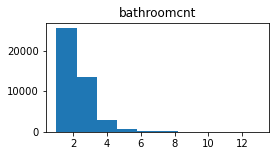

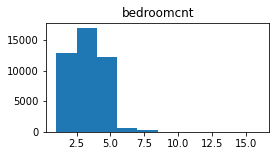

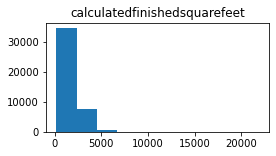

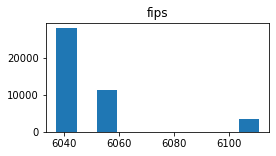

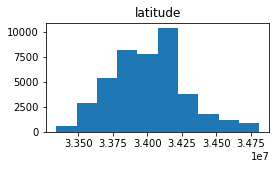

...

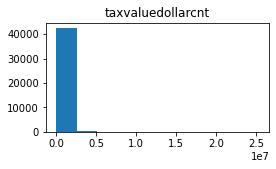

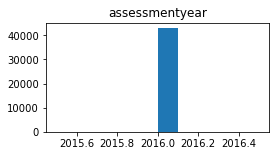

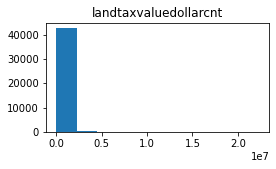

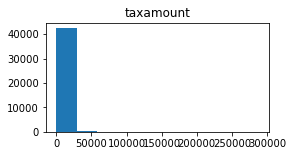

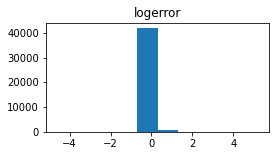

TypeError: '<=' not supported between instances of 'pandas._libs.interval.Interval' and 'float'

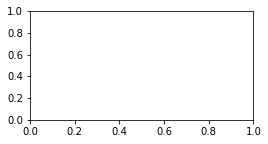

In [49]:
for col in train.columns:
    plt.figure(figsize=(4,2))
    plt.hist(train[col])
    plt.title(col)
    plt.show()

### Does the mean logerror differ among the three counties?
LA_County = 6037

Orange_County = 6059

Ventura_County = 6111

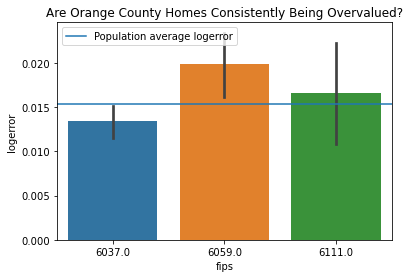

In [50]:
plt.title("Are Orange County Homes Consistently Being Overvalued?")
sns.barplot(x="fips", y="logerror", data=train)
population_logerror_mean = train.logerror.mean()
plt.axhline(population_logerror_mean, label="Population average logerror")
plt.legend()
plt.show()

# Takeaway
* The mean logerror of Orange County seems to be significantly higher than the population average.
* The mean logerror of Ventura County seems slightly higher than the population average.
* The mean logerror of LA County seems slightly lower than the population average.

### I will run a statistical test to compare the mean logerror between counties.

In [51]:
# Create a dataframe for each county.
LA_county = train[train['fips']== 6037]
Ventura_county = train[train['fips']== 6111]
Orange_county = train[train['fips']== 6059]

# Create list of counties to make looping easier.
county_list = [LA_county, Ventura_county, Orange_county]

# Verify shape of new dataframes.
LA_county.shape, Ventura_county.shape, Orange_county.shape

# Create variables that hold the logerror values for each county.
LA_logerror = LA_county['logerror']
Ventura_logerror = Ventura_county['logerror']
Orange_logerror = Orange_county['logerror']

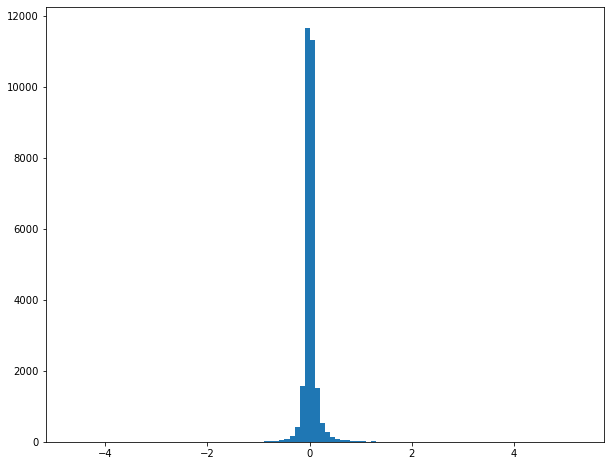

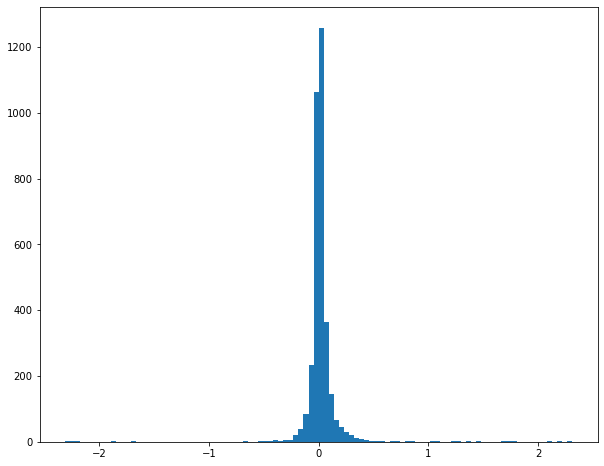

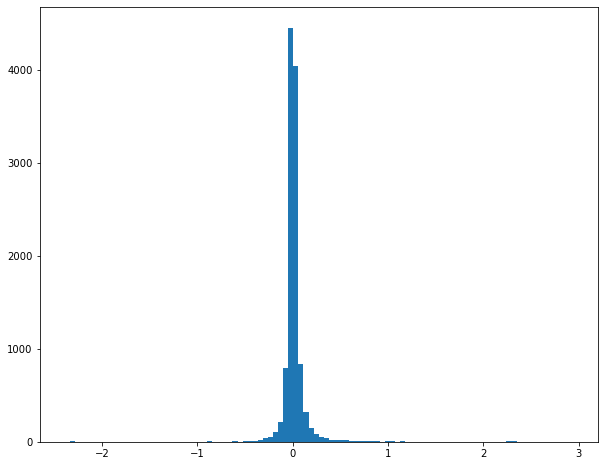

In [52]:
# Plot a histogram of logerror for each county.

for county in county_list:
    plt.figure(figsize=(10,8))
    plt.hist('logerror', bins=100, data=county)
    plt.show()

# Takeaways
* The logerror in all three counties are normally(ish) distributed. I will continue with an Independent t-test(setting equal_var to False if I must).

#### $H_0$: The mean logerror of Orange County is equal to the mean logerror of Ventura County.
#### $H_a$: The mean logerror of Orange County is greater than the mean logerror of Ventura County.

In [53]:
# Check variances
LA_logerror.var(), Ventura_logerror.var(), Orange_logerror.var()

(0.026026983001619233, 0.027130955164700727, 0.036222866998233724)

In [54]:
# A stats Levene test - returns p value. small p-value means unequal variances
print(stats.levene(LA_logerror, Ventura_logerror))
print(stats.levene(LA_logerror, Orange_logerror))
print(stats.levene(Ventura_logerror, Orange_logerror))
# high p-value suggests that the populations have equal variances

LeveneResult(statistic=15.472547496293307, pvalue=8.389147558515473e-05)
LeveneResult(statistic=19.136261280744204, pvalue=1.220217030165826e-05)
LeveneResult(statistic=0.6767895368007999, pvalue=0.4107076057605129)


# Takeaway
* There are equal variances between LA County logerror and both Ventura County and Orange County logerror.
* There is an unqual variance between Ventura County logerror and Orange County logerror.
* I will set the equal_var argument to False for the Ventura_vs_Orange Independent T-Test.

In [55]:
# Set the level of significance (alpha):
alpha = 0.05

In [56]:
# Use a Kruskal-Wallis test to test for equality in mean logerror between the three counties.
t, p = stats.kruskal(LA_logerror, Ventura_logerror, Orange_logerror)
print(f'p-value: {p}')
if p < alpha:
    print("We reject the null hypothesis that the mean logerror of the three counties are equal.")
else:
    pinrt("We fail to reject the null hypothesis.")

p-value: 0.0011888903721980076
We reject the null hypothesis that the mean logerror of the three counties are equal.


# Takeaway
* There is a difference between the three counties in mean logerror. I will create dummy variables for the counties and use them as a features in my model. 

In [57]:
# Create dummy variables for the counties.
def get_counties(df):
    '''
    This function will create dummy variables out of the original fips column. 
    And return a dataframe with all of the original columns except regionidcounty.
    We will keep fips column for data validation after making changes. 
    New columns added will be 'LA', 'Orange', and 'Ventura' which are boolean 
    The fips ids are renamed to be the name of the county each represents. 
    '''
    # create dummy vars of fips id
    county_df = pd.get_dummies(df.fips)
    # rename columns by actual county name
    county_df.columns = ['LA', 'Orange', 'Ventura']
    # concatenate the dataframe with the 3 county columns to the original dataframe
    df_dummies = pd.concat([df, county_df], axis = 1)
    # drop regionidcounty and fips columns
    return df_dummies

In [58]:
train = get_counties(train)

In [59]:
train

,bathroomcnt,bedroomcnt,calculatedfinishedsquarefeet,fips,latitude,longitude,lotsizesquarefeet,roomcnt,yearbuilt,structuretaxvaluedollarcnt,taxvaluedollarcnt,assessmentyear,landtaxvaluedollarcnt,taxamount,logerror,logerror_bin,LA,Orange,Ventura
45257,1.0,2.0,1148.0,6037.0,34119962.0,-118217185.0,6019.0,0.0,1922.0,110662.0,553311.0,2016.0,442649.0,6724.25,-0.307749,"(-1.655, -0.155]",1,0,0
54021,2.0,2.0,898.0,6037.0,34113215.0,-118216168.0,6422.0,0.0,1947.0,150127.0,600517.0,2016.0,450390.0,7192.46,-0.123643,"(-0.155, 1.345]",1,0,0
71314,1.0,1.0,1010.0,6037.0,34762455.0,-118274177.0,99411.0,0.0,1948.0,64420.0,88779.0,2016.0,24359.0,4153.06,-0.002535,"(-0.155, 1.345]",1,0,0
8173,2.0,3.0,1218.0,6037.0,33984328.0,-118319988.0,4802.0,0.0,1923.0,66000.0,334000.0,2016.0,268000.0,4062.89,-0.045101,"(-0.155, 1.345]",1,0,0
20821,1.0,1.0,835.0,6037.0,34410700.0,-118561000.0,842267.0,0.0,1989.0,141531.0,211532.0,2016.0,70001.0,3470.57,0.014981,"(-0.155, 1.345]",1,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1261,2.0,3.0,1054.0,6059.0,33673616.0,-117827506.0,5100.0,5.0,1969.0,73538.0,488770.0,2016.0,415232.0,5084.94,0.115894,"(-0.155, 1.345]",0,1,0
15118,3.0,4.0,2252.0,6037.0,34163340.0,-118483751.0,9179.0,0.0,1955.0,273029.0,700078.0,2016.0,427049.0,8534.24,-0.146035,"(-0.155, 1.345]",1,0,0
54436,2.5,5.0,1992.0,6059.0,33879098.0,-117989539.0,2607.0,9.0,1966.0,50111.0,71680.0,2016.0,21569.0,1054.76,0.014192,"(-0.155, 1.345]",0,1,0
19528,3.0,2.0,1253.0,6037.0,34281150.0,-118577269.0,49231.9,0.0,2007.0,343693.0,491774.0,2016.0,148081.0,5945.66,-0.009137,"(-0.155, 1.345]",1,0,0


### From the pairplot I noticed that there was a greater variance in mean logerror for homes built after 1940. I will bin the train.yearbuilt into two bins 0: Houses built before 1940 and 1: Houses built after 1940.

### Takeaway
* It seems as if the variance in logerror increases for homes built after 1940.
* There seems to be 3 clusters. A middle cluster where most of the datapoints are situated, a top cluster, and a lower cluster.
* Maybe if create one bin from yearbuilt from yearbuilt.min() to about yearbuilt <= 1940 and one more bin for homes built after 1940 and compare the means between the two bins to see if there is a statistical difference.

In [516]:
train['age_bins'] = pd.cut(train.yearbuilt, 10, labels=False)
X_train['age_bins'] = pd.cut(train.yearbuilt, 10, labels=False)
X_train_scaled['age_bins'] = pd.cut(train.yearbuilt, 10, labels=False)

In [61]:
train.age_bins.value_counts()

5    9374
7    8872
6    8353
8    5891
9    3724
4    3002
3    2847
2     741
1     143
0      16
Name: age_bins, dtype: int64

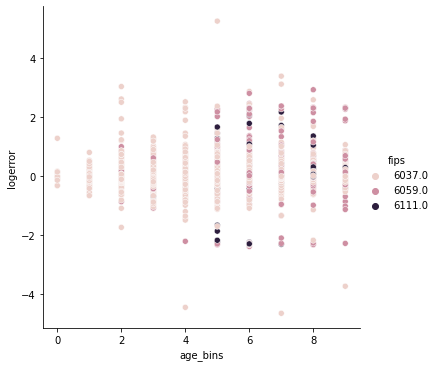

In [62]:
sns.relplot(train.age_bins, train.logerror, data=train, hue='fips')

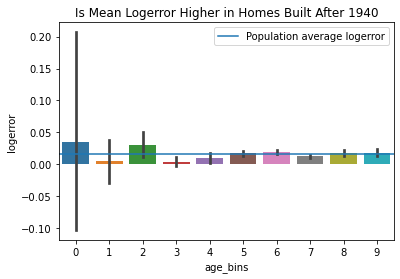

In [63]:
plt.title("Is Mean Logerror Higher in Homes Built After 1940")
sns.barplot(x="age_bins", y="logerror", data=train)
population_logerror_mean = train.logerror.mean()
plt.axhline(population_logerror_mean, label="Population average logerror")
plt.legend()
plt.show()

# Takeaway
* Homes built before 1940(0) seem to have a lower mean logerror than the population.
* I will plot the distribution of the data and test for equal variance to determine which statistical test to run.

In [64]:
older_homes_logerror = train[train.age_bins <= 4].logerror
newer_homes_logerror = train[train.age_bins >= 5].logerror

### $H_0$: There is no difference in mean logerror between older homes and newer homes.
### $H_a$: There is a difference in mean logerror between older homes and newer homes.

In [65]:
# Check for equal variances.
# A stats Levene test - returns p value. small p-value means unequal variances.
t, p = stats.levene(older_homes_logerror, newer_homes_logerror)
# high p-value suggests that the populations have equal variances.

if p < alpha:
    print(f'p-value: {p}. There is unequal variance.')

p-value: 2.608062727481541e-81. There is unequal variance.


In [66]:
# Run a Independent T-Test to test for a difference in mean logerror between newer homes and older homes.
t, p = stats.ttest_ind(older_homes_logerror, newer_homes_logerror, equal_var=False)
if p < alpha:
    print(f'p-value: {p}. We reject the null hypothesis.')
else:
    print('We fail to reject the null hypothesis.')

p-value: 0.008812861343145793. We reject the null hypothesis.


# Takeaway
* The mean logerror for newer homes seems to be greater than the mean logerror for older homes.

In [67]:
X_train_scaled.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 42963 entries, 45257 to 9184
Data columns (total 15 columns):
 #   Column                        Non-Null Count  Dtype  
---  ------                        --------------  -----  
 0   bathroomcnt                   42963 non-null  float64
 1   bedroomcnt                    42963 non-null  float64
 2   calculatedfinishedsquarefeet  42963 non-null  float64
 3   fips                          42963 non-null  float64
 4   latitude                      42963 non-null  float64
 5   longitude                     42963 non-null  float64
 6   lotsizesquarefeet             42963 non-null  float64
 7   roomcnt                       42963 non-null  float64
 8   yearbuilt                     42963 non-null  float64
 9   structuretaxvaluedollarcnt    42963 non-null  float64
 10  taxvaluedollarcnt             42963 non-null  float64
 11  assessmentyear                42963 non-null  float64
 12  landtaxvaluedollarcnt         42963 non-null  float64
 13

# Speaking of clusters...

In [522]:
X = X_train_scaled[['latitude','longitude','yearbuilt']]

In [523]:
X

,latitude,longitude,yearbuilt
12706,0.250567,0.803754,0.659420
38400,0.534414,0.851703,0.557971
75067,0.473307,0.481406,0.615942
68921,0.257301,0.888805,0.891304
14454,0.302190,0.758920,0.905797
...,...,...,...
17368,0.553478,0.656214,0.557971
24249,0.554636,0.504370,0.615942
9322,0.201021,0.832629,0.623188
1991,0.560217,0.170145,0.753623


In [221]:
# Create the KMeans object with three clusters.
kmeans = KMeans(n_clusters=3)

# Fit the KMeans object on the X values.
kmeans.fit(X)

# Use the KMeans object to predict the X_values and create a new column to store the values.
kmeans.predict(X)

In [70]:
train.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 42963 entries, 45257 to 9184
Data columns (total 20 columns):
 #   Column                        Non-Null Count  Dtype   
---  ------                        --------------  -----   
 0   bathroomcnt                   42963 non-null  float64 
 1   bedroomcnt                    42963 non-null  float64 
 2   calculatedfinishedsquarefeet  42963 non-null  float64 
 3   fips                          42963 non-null  float64 
 4   latitude                      42963 non-null  float64 
 5   longitude                     42963 non-null  float64 
 6   lotsizesquarefeet             42963 non-null  float64 
 7   roomcnt                       42963 non-null  float64 
 8   yearbuilt                     42963 non-null  float64 
 9   structuretaxvaluedollarcnt    42963 non-null  float64 
 10  taxvaluedollarcnt             42963 non-null  float64 
 11  assessmentyear                42963 non-null  float64 
 12  landtaxvaluedollarcnt         42963 non-nul

In [71]:
train['cluster'] = kmeans.predict(X)
X_train['cluster'] = kmeans.predict(X)
X_train_scaled['cluster'] = kmeans.predict(X)

In [72]:
kmeans.cluster_centers_

array([[0.28744544, 0.83104238, 0.75423686],
       [0.64009718, 0.48098763, 0.75382025],
       [0.45307374, 0.65905997, 0.48286898]])

In [73]:
centroids = pd.DataFrame(kmeans.cluster_centers_, columns=X.columns)
centroids

,latitude,longitude,yearbuilt
0,0.287445,0.831042,0.754237
1,0.640097,0.480988,0.753820
2,0.453074,0.659060,0.482869


In [144]:
X

,latitude,longitude,yearbuilt,cluster
45257,0.530507,0.655314,0.318841,1
54021,0.525921,0.655844,0.500000,1
71314,0.967247,0.625631,0.507246,3
8173,0.438309,0.601772,0.326087,1
20821,0.728139,0.476248,0.804348,3
...,...,...,...,...
1261,0.227100,0.858267,0.659420,0
15118,0.559994,0.516481,0.557971,1
54436,0.366778,0.773877,0.637681,0
19528,0.640076,0.467774,0.934783,3


Text(0.5, 1.0, 'Visualizing Cluster Centers')

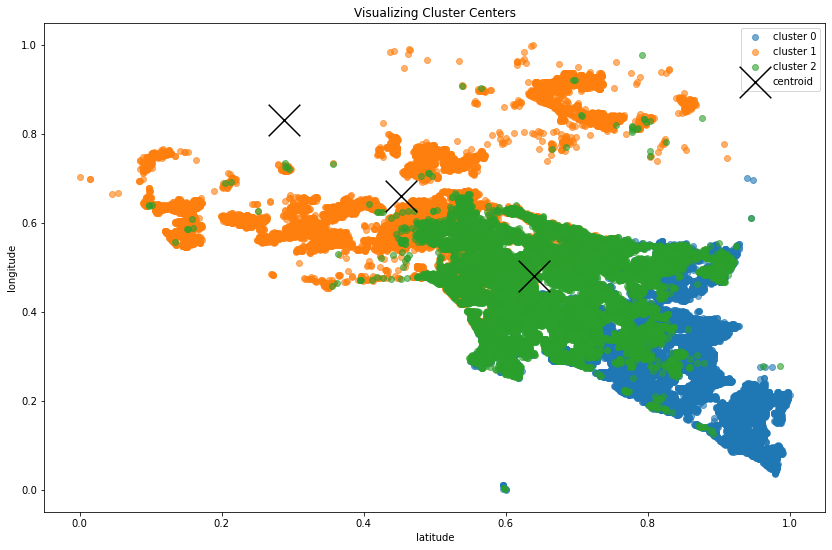

In [74]:
plt.figure(figsize=(14, 9))

for cluster, subset in X_train_scaled.groupby('cluster'):
    plt.scatter(subset.longitude, subset.latitude, label='cluster ' + str(cluster), alpha=.6)

centroids.plot.scatter(y='longitude', x='latitude', c='black', marker='x', s=1000, ax=plt.gca(), label='centroid')

plt.legend()
plt.xlabel('latitude')
plt.ylabel('longitude')
plt.title('Visualizing Cluster Centers')

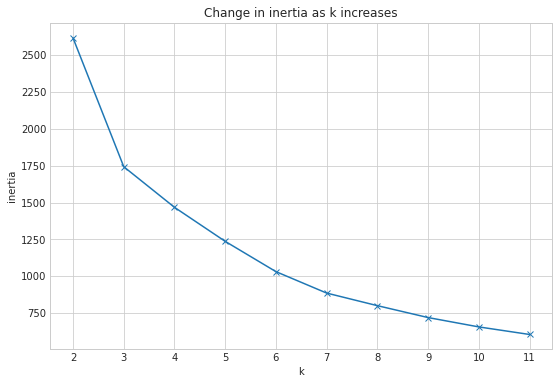

In [75]:
with plt.style.context('seaborn-whitegrid'):
    plt.figure(figsize=(9, 6))
    pd.Series({k: KMeans(k).fit(X).inertia_ for k in range(2, 12)}).plot(marker='x')
    plt.xticks(range(2, 12))
    plt.xlabel('k')
    plt.ylabel('inertia')
    plt.title('Change in inertia as k increases')

In [519]:
# Create the KMeans object with four clusters.
kmeans = KMeans(n_clusters=4)

# Fit the KMeans object on the X values.
kmeans.fit(X)

# Use the KMeans object to predict the X_values and create a new column to store the values.
kmeans.predict(X)

array([1, 1, 3, ..., 0, 3, 3], dtype=int32)

In [521]:
X

,latitude,longitude,yearbuilt
45257,0.530507,0.655314,0.318841
54021,0.525921,0.655844,0.500000
71314,0.967247,0.625631,0.507246
8173,0.438309,0.601772,0.326087
20821,0.728139,0.476248,0.804348
...,...,...,...
1261,0.227100,0.858267,0.659420
15118,0.559994,0.516481,0.557971
54436,0.366778,0.773877,0.637681
19528,0.640076,0.467774,0.934783


In [520]:
X_train['cluster'] = kmeans.predict(X)
X_train_scaled['cluster'] = kmeans.predict(X)

ValueError: Length of values (42963) does not match length of index (43385)

In [78]:
kmeans.cluster_centers_

array([[0.27690262, 0.83574806, 0.75097074],
       [0.45320859, 0.65817376, 0.48564972],
       [0.59720126, 0.3459628 , 0.70101391],
       [0.66675255, 0.61181031, 0.80616144]])

In [79]:
centroids = pd.DataFrame(kmeans.cluster_centers_, columns=X.columns)
centroids

,latitude,longitude,yearbuilt
0,0.276903,0.835748,0.750971
1,0.453209,0.658174,0.485650
2,0.597201,0.345963,0.701014
3,0.666753,0.611810,0.806161


Text(0.5, 1.0, 'Visualizing Cluster Centers')

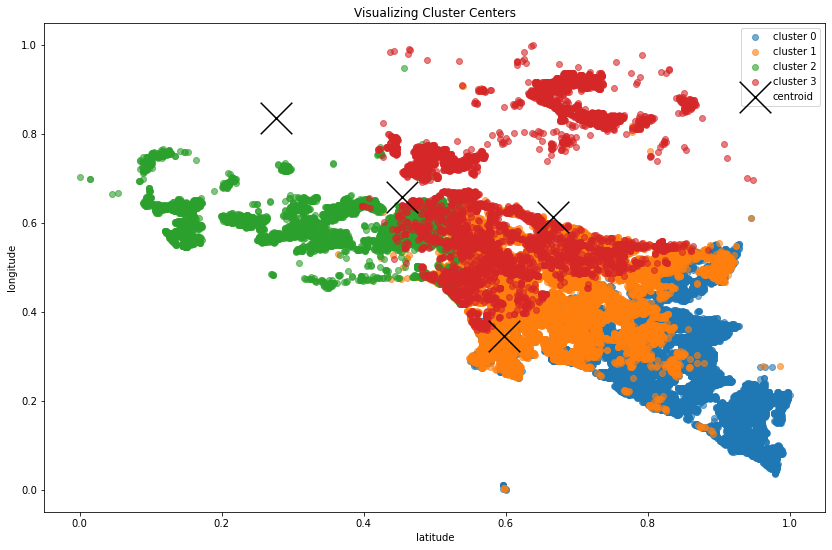

In [80]:
plt.figure(figsize=(14, 9))

for cluster, subset in X_train_scaled.groupby('cluster'):
    plt.scatter(subset.longitude, subset.latitude, label='cluster ' + str(cluster), alpha=.6)

centroids.plot.scatter(y='longitude', x='latitude', c='black', marker='x', s=1000, ax=plt.gca(), label='centroid')

plt.legend()
plt.xlabel('latitude')
plt.ylabel('longitude')
plt.title('Visualizing Cluster Centers')

## Time to explore our clusters.

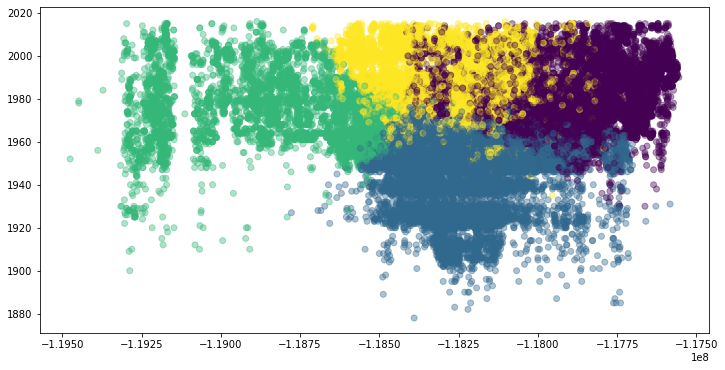

In [81]:
plt.figure(figsize=(12,6))
#plt.scatter(y=X_train.latitude, x=X_train.longitude, c=X_train.cluster, alpha=.4)
plt.scatter(y=X_train.yearbuilt, x=X_train.longitude, c=X_train.cluster, alpha=.4)

Text(0.5, 1.0, 'Do clusters reveal differences in age and error?')

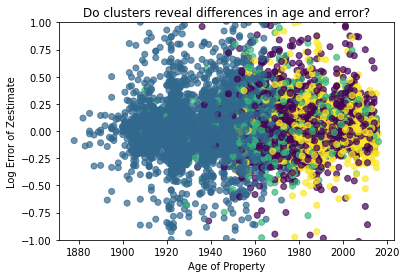

In [82]:
plt.scatter(y=y_train.logerror, x=X_train.yearbuilt, c=X_train.cluster, alpha=.7)
plt.ylim(-1,1)
plt.xlabel('Age of Property')
plt.ylabel('Log Error of Zestimate')
plt.title("Do clusters reveal differences in age and error?")

In [83]:
X_train.cluster.value_counts()

1    15467
0    13816
3     7548
2     6132
Name: cluster, dtype: int64

In [84]:
X['cluster'] = kmeans.predict(X)

In [85]:
train

,bathroomcnt,bedroomcnt,calculatedfinishedsquarefeet,fips,latitude,longitude,lotsizesquarefeet,roomcnt,yearbuilt,structuretaxvaluedollarcnt,...,assessmentyear,landtaxvaluedollarcnt,taxamount,logerror,logerror_bin,LA,Orange,Ventura,age_bins,cluster
45257,1.0,2.0,1148.0,6037.0,34119962.0,-118217185.0,6019.0,0.0,1922.0,110662.0,...,2016.0,442649.0,6724.25,-0.307749,"(-1.655, -0.155]",1,0,0,3,2
54021,2.0,2.0,898.0,6037.0,34113215.0,-118216168.0,6422.0,0.0,1947.0,150127.0,...,2016.0,450390.0,7192.46,-0.123643,"(-0.155, 1.345]",1,0,0,4,2
71314,1.0,1.0,1010.0,6037.0,34762455.0,-118274177.0,99411.0,0.0,1948.0,64420.0,...,2016.0,24359.0,4153.06,-0.002535,"(-0.155, 1.345]",1,0,0,5,1
8173,2.0,3.0,1218.0,6037.0,33984328.0,-118319988.0,4802.0,0.0,1923.0,66000.0,...,2016.0,268000.0,4062.89,-0.045101,"(-0.155, 1.345]",1,0,0,3,2
20821,1.0,1.0,835.0,6037.0,34410700.0,-118561000.0,842267.0,0.0,1989.0,141531.0,...,2016.0,70001.0,3470.57,0.014981,"(-0.155, 1.345]",1,0,0,8,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1261,2.0,3.0,1054.0,6059.0,33673616.0,-117827506.0,5100.0,5.0,1969.0,73538.0,...,2016.0,415232.0,5084.94,0.115894,"(-0.155, 1.345]",0,1,0,6,0
15118,3.0,4.0,2252.0,6037.0,34163340.0,-118483751.0,9179.0,0.0,1955.0,273029.0,...,2016.0,427049.0,8534.24,-0.146035,"(-0.155, 1.345]",1,0,0,5,2
54436,2.5,5.0,1992.0,6059.0,33879098.0,-117989539.0,2607.0,9.0,1966.0,50111.0,...,2016.0,21569.0,1054.76,0.014192,"(-0.155, 1.345]",0,1,0,6,0
19528,3.0,2.0,1253.0,6037.0,34281150.0,-118577269.0,49231.9,0.0,2007.0,343693.0,...,2016.0,148081.0,5945.66,-0.009137,"(-0.155, 1.345]",1,0,0,9,1


In [86]:
cluster_0 = train[train['cluster']==0]
cluster_1 = train[train['cluster']==1]
cluster_2 = train[train['cluster']==2]
cluster_3 = train[train['cluster']==3]

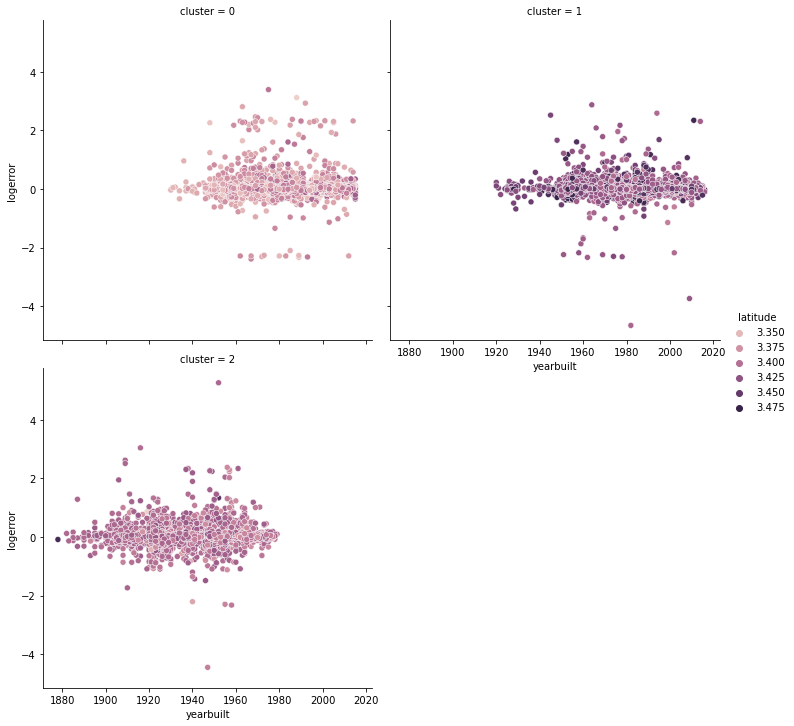

In [87]:
# plot out income vs. spending with regard to the cluster and age
sns.relplot(data=train, x="yearbuilt", y="logerror", col="cluster", hue="latitude", col_wrap=2)

In [88]:
train.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 42963 entries, 45257 to 9184
Data columns (total 21 columns):
 #   Column                        Non-Null Count  Dtype   
---  ------                        --------------  -----   
 0   bathroomcnt                   42963 non-null  float64 
 1   bedroomcnt                    42963 non-null  float64 
 2   calculatedfinishedsquarefeet  42963 non-null  float64 
 3   fips                          42963 non-null  float64 
 4   latitude                      42963 non-null  float64 
 5   longitude                     42963 non-null  float64 
 6   lotsizesquarefeet             42963 non-null  float64 
 7   roomcnt                       42963 non-null  float64 
 8   yearbuilt                     42963 non-null  float64 
 9   structuretaxvaluedollarcnt    42963 non-null  float64 
 10  taxvaluedollarcnt             42963 non-null  float64 
 11  assessmentyear                42963 non-null  float64 
 12  landtaxvaluedollarcnt         42963 non-nul

In [89]:
X_train.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 42963 entries, 45257 to 9184
Data columns (total 16 columns):
 #   Column                        Non-Null Count  Dtype  
---  ------                        --------------  -----  
 0   bathroomcnt                   42963 non-null  float64
 1   bedroomcnt                    42963 non-null  float64
 2   calculatedfinishedsquarefeet  42963 non-null  float64
 3   fips                          42963 non-null  float64
 4   latitude                      42963 non-null  float64
 5   longitude                     42963 non-null  float64
 6   lotsizesquarefeet             42963 non-null  float64
 7   roomcnt                       42963 non-null  float64
 8   yearbuilt                     42963 non-null  float64
 9   structuretaxvaluedollarcnt    42963 non-null  float64
 10  taxvaluedollarcnt             42963 non-null  float64
 11  assessmentyear                42963 non-null  float64
 12  landtaxvaluedollarcnt         42963 non-null  float64
 13

In [90]:
X_train_scaled.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 42963 entries, 45257 to 9184
Data columns (total 16 columns):
 #   Column                        Non-Null Count  Dtype  
---  ------                        --------------  -----  
 0   bathroomcnt                   42963 non-null  float64
 1   bedroomcnt                    42963 non-null  float64
 2   calculatedfinishedsquarefeet  42963 non-null  float64
 3   fips                          42963 non-null  float64
 4   latitude                      42963 non-null  float64
 5   longitude                     42963 non-null  float64
 6   lotsizesquarefeet             42963 non-null  float64
 7   roomcnt                       42963 non-null  float64
 8   yearbuilt                     42963 non-null  float64
 9   structuretaxvaluedollarcnt    42963 non-null  float64
 10  taxvaluedollarcnt             42963 non-null  float64
 11  assessmentyear                42963 non-null  float64
 12  landtaxvaluedollarcnt         42963 non-null  float64
 13

In [514]:
X_train_scaled

,bathroomcnt,bedroomcnt,calculatedfinishedsquarefeet,fips,latitude,longitude,lotsizesquarefeet,roomcnt,yearbuilt,structuretaxvaluedollarcnt,taxvaluedollarcnt,assessmentyear,landtaxvaluedollarcnt,taxamount
12706,0.227273,0.250000,0.033566,0.297297,0.250567,0.803754,0.000156,0.428571,0.659420,0.007542,0.016544,0.0,0.016583,0.015922
38400,0.181818,0.333333,0.030806,0.000000,0.534414,0.851703,0.000850,0.000000,0.557971,0.003571,0.007781,0.0,0.007867,0.001494
75067,0.181818,0.166667,0.035228,0.000000,0.473307,0.481406,0.029285,0.000000,0.615942,0.039544,0.030938,0.0,0.015798,0.031294
68921,0.227273,0.250000,0.067498,0.297297,0.257301,0.888805,0.000521,0.000000,0.891304,0.021109,0.033878,0.0,0.030439,0.036913
14454,0.272727,0.333333,0.059022,0.297297,0.302190,0.758920,0.000870,0.428571,0.905797,0.016071,0.008465,0.0,0.001322,0.010351
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
17368,0.090909,0.166667,0.025907,0.000000,0.553478,0.656214,0.000976,0.000000,0.557971,0.006737,0.015698,0.0,0.015992,0.014616
24249,0.181818,0.166667,0.028610,0.000000,0.554636,0.504370,0.003746,0.000000,0.615942,0.010861,0.008710,0.0,0.004718,0.008795
9322,0.181818,0.250000,0.039958,0.297297,0.201021,0.832629,0.000335,0.428571,0.623188,0.009363,0.033014,0.0,0.036310,0.030230
1991,0.227273,0.250000,0.040690,1.000000,0.560217,0.170145,0.000130,0.500000,0.753623,0.015220,0.011777,0.0,0.006010,0.011398


In [324]:
lm = LinearRegression()
rfe = RFE(lm, n_features_to_select=16)

In [330]:
# Transform data using the rfe
X_rfe = rfe.fit_transform(X_train_scaled, y_train)

array([[0.        , 0.06666667, 0.04573633, ..., 0.        , 2.        ,
        0.        ],
       [0.08333333, 0.06666667, 0.03425633, ..., 0.        , 2.        ,
        0.        ],
       [0.        , 0.        , 0.03939937, ..., 0.        , 2.        ,
        0.        ],
       ...,
       [0.125     , 0.26666667, 0.08449281, ..., 0.        , 3.        ,
        0.        ],
       [0.16666667, 0.06666667, 0.05055793, ..., 0.        , 2.        ,
        0.        ],
       [0.16666667, 0.06666667, 0.05625201, ..., 0.        , 2.        ,
        0.        ]])

In [326]:
# Fitting the data to model
lm.fit(X_rfe, y_train)

LinearRegression()

In [327]:
mask = rfe.support_

In [328]:
rfe_features = X_train_scaled.loc[:, mask].columns.tolist()

In [329]:
rfe_features

['bathroomcnt',
 'bedroomcnt',
 'calculatedfinishedsquarefeet',
 'fips',
 'longitude',
 'lotsizesquarefeet',
 'roomcnt',
 'yearbuilt',
 'structuretaxvaluedollarcnt',
 'taxvaluedollarcnt',
 'landtaxvaluedollarcnt',
 'taxamount',
 'age_bins',
 'cluster_4',
 'cluster_5',
 'cluster_8']

In [111]:
train.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 42963 entries, 45257 to 9184
Data columns (total 21 columns):
 #   Column                        Non-Null Count  Dtype   
---  ------                        --------------  -----   
 0   bathroomcnt                   42963 non-null  float64 
 1   bedroomcnt                    42963 non-null  float64 
 2   calculatedfinishedsquarefeet  42963 non-null  float64 
 3   fips                          42963 non-null  float64 
 4   latitude                      42963 non-null  float64 
 5   longitude                     42963 non-null  float64 
 6   lotsizesquarefeet             42963 non-null  float64 
 7   roomcnt                       42963 non-null  float64 
 8   yearbuilt                     42963 non-null  float64 
 9   structuretaxvaluedollarcnt    42963 non-null  float64 
 10  taxvaluedollarcnt             42963 non-null  float64 
 11  assessmentyear                42963 non-null  float64 
 12  landtaxvaluedollarcnt         42963 non-nul

In [128]:
run_this_through_the_triplet_function = list(X_train_scaled.columns)

In [360]:
# Get every possible combination of a set of three features
list_of_feature_combinations = list(combinations(run_this_through_the_triplet_function,3))

In [361]:
# Fit this with clustering? I think that's the correct term. What is the length?
len(list_of_feature_combinations)

560

### I have a list of 560 combinations of features to cluster on. If I divide it into groups of 100 I will have 56 (560/100) lists of features to work on at a time as to not overload the computer. I will print the [{inertia vs k}] graph for each group of ten and choose a k value based on the graphs. After I have my k value for each group I will assign that to the number of centroids for each group.

In [362]:
# I will convert all the tuples into lists and then to eventually Pandas dataframes.
# I'm not sure how long this will take. So I will test it on the first 10.
first_hundred = list_of_feature_combinations[:100]
second_hundred = list_of_feature_combinations[100:200]
third_hundred = list_of_feature_combinations[200:300]
fourth_hundred = list_of_feature_combinations[300:400]
fifth_hundred = list_of_feature_combinations[400:500]
last_sixty = list_of_feature_combinations[500:]

In [367]:
## THIS FUNCTION IS CURRENTLY UNDER CONSTRUCTION. PLEASE DO NOT ENTER... UNLESS YOU WANT TO PEFECT IT FOR ME.
# This function will take in a list of feature combinations which will be used for clustering. It will 
# return a list of the top 100 features:
#def get_rfe_ranking_for_bdoggs_clusters(hunnid):
#    # Create a list of the 100 features.
#    list_of_hundred_features = []
#    for combo in hunnid:
#        list_of_hundred_features.append(list(combo))
#    # Convert into dataframes.
#    list_of_dataframes = []
#    for combo in list_of_first_hundred_features:
#        list_of_dataframes.append(X_train[combo])
#    # plot delta(inertia) graphs for each group of clusters. Takes ~ 42.37 seconds to run on 10 clusters. Might want to ask Ryan if it's possible to cache the information that is returned.
#    # 100 dataframes will take ~ 9 minutes and 10 seconds to render  & CPU % up to 675
#    # *** ONLY RUN IF YOU HAVE TIME! ***
#    for combo in list_of_dataframes:
#        with plt.style.context('seaborn-whitegrid'):
#            plt.figure(figsize=(9, 6))
#            pd.Series({k: KMeans(k).fit(combo).inertia_ for k in range(2, 12)}).plot(marker='x')
#            plt.xticks(range(2, 12))
#            plt.xlabel('k')
#            plt.ylabel('inertia')
#            plt.title('Change in inertia as k increases')
#    
#    # This cell will iterate through the list of dataframes and fit the kmeans with the specified number of centroids extracted from the [{inertia vs k}] graphs above.
#
#    # This cell takes ~ 30 seconds  to render with 100 clusters.
#
#    # set i to be the iteration count for number_of_centroids index
#    # set n to be the iteration count for list_of_dataframes index
#    i = 0
#    k = 0
#    list_of_cluster_predictions = []
#    for combo in list_of_dataframes: 
#        kmeans = KMeans(n_clusters = number_of_centroids[k])
#        kmeans.fit(list_of_dataframes[i])
#        X_train_scaled['cluster_' + str(i)] = kmeans.predict(combo)
#        list_of_cluster_predictions.append(kmeans.predict(list_of_dataframes[i]))
#        i += 1
#        k += 1
#    # Initialize the linear regression object!
#    lm = LinearRegression()
#
#    # Initialize the RFE object, setting the hyperparameters to be our linear regression object created above
#    # (as the algorithm to test the features on) and the number of features to return to be 5.
#    rfe = RFE(lm, n_features_to_select=16)
#
#    # Fit the RFE object to our data. This means create multiple linear regression models, find the one that 
#    # performs best, and identify the features that are used in that model. Those are the features we want.
#    # Transform our X dataframe to include only those 2 features. .transform() or do both of those steps together 
#    # with .fit_transform()
#
#    # Transforming data using RFE.
#    X_rfe = rfe.fit_transform(X_train_scaled,y_train)  
#
#    #Fitting the data to model.
#    lm.fit(X_rfe,y_train)
#    
#    # Create boolean mask.
#    mask = rfe.support_
#    
#    # Store top 100 features into this variable.
#    rfe_features = X_train_scaled.loc[:, mask].columns.tolist()
#    
#    return rfe_features

# First Hundred

In [512]:
# Create a list of the first 100 features.
list_of_hundred_features = []
for combo in first_hundred:
    list_of_hundred_features.append(list(combo))

In [374]:
 list_of_hundred_features

[['bathroomcnt', 'landtaxvaluedollarcnt', 'age_bins'],
 ['bathroomcnt', 'landtaxvaluedollarcnt', 'cluster'],
 ['bathroomcnt', 'taxamount', 'age_bins'],
 ['bathroomcnt', 'taxamount', 'cluster'],
 ['bathroomcnt', 'age_bins', 'cluster'],
 ['bedroomcnt', 'calculatedfinishedsquarefeet', 'fips'],
 ['bedroomcnt', 'calculatedfinishedsquarefeet', 'latitude'],
 ['bedroomcnt', 'calculatedfinishedsquarefeet', 'longitude'],
 ['bedroomcnt', 'calculatedfinishedsquarefeet', 'lotsizesquarefeet'],
 ['bedroomcnt', 'calculatedfinishedsquarefeet', 'roomcnt'],
 ['bedroomcnt', 'calculatedfinishedsquarefeet', 'yearbuilt'],
 ['bedroomcnt', 'calculatedfinishedsquarefeet', 'structuretaxvaluedollarcnt'],
 ['bedroomcnt', 'calculatedfinishedsquarefeet', 'taxvaluedollarcnt'],
 ['bedroomcnt', 'calculatedfinishedsquarefeet', 'assessmentyear'],
 ['bedroomcnt', 'calculatedfinishedsquarefeet', 'landtaxvaluedollarcnt'],
 ['bedroomcnt', 'calculatedfinishedsquarefeet', 'taxamount'],
 ['bedroomcnt', 'calculatedfinishedsquare

In [510]:
X_train_scaled

,bathroomcnt,bedroomcnt,calculatedfinishedsquarefeet,fips,latitude,longitude,lotsizesquarefeet,roomcnt,yearbuilt,structuretaxvaluedollarcnt,taxvaluedollarcnt,assessmentyear,landtaxvaluedollarcnt,taxamount
12706,0.227273,0.250000,0.033566,0.297297,0.250567,0.803754,0.000156,0.428571,0.659420,0.007542,0.016544,0.0,0.016583,0.015922
38400,0.181818,0.333333,0.030806,0.000000,0.534414,0.851703,0.000850,0.000000,0.557971,0.003571,0.007781,0.0,0.007867,0.001494
75067,0.181818,0.166667,0.035228,0.000000,0.473307,0.481406,0.029285,0.000000,0.615942,0.039544,0.030938,0.0,0.015798,0.031294
68921,0.227273,0.250000,0.067498,0.297297,0.257301,0.888805,0.000521,0.000000,0.891304,0.021109,0.033878,0.0,0.030439,0.036913
14454,0.272727,0.333333,0.059022,0.297297,0.302190,0.758920,0.000870,0.428571,0.905797,0.016071,0.008465,0.0,0.001322,0.010351
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
17368,0.090909,0.166667,0.025907,0.000000,0.553478,0.656214,0.000976,0.000000,0.557971,0.006737,0.015698,0.0,0.015992,0.014616
24249,0.181818,0.166667,0.028610,0.000000,0.554636,0.504370,0.003746,0.000000,0.615942,0.010861,0.008710,0.0,0.004718,0.008795
9322,0.181818,0.250000,0.039958,0.297297,0.201021,0.832629,0.000335,0.428571,0.623188,0.009363,0.033014,0.0,0.036310,0.030230
1991,0.227273,0.250000,0.040690,1.000000,0.560217,0.170145,0.000130,0.500000,0.753623,0.015220,0.011777,0.0,0.006010,0.011398


In [524]:
train['age_bins'] = pd.cut(train.yearbuilt, 10, labels=False)
X_train['age_bins'] = pd.cut(train.yearbuilt, 10, labels=False)
X_train_scaled['age_bins'] = pd.cut(train.yearbuilt, 10, labels=False)
X_train_scaled['cluster'] = kmeans.predict(X)

In [525]:
X_train_scaled

,bathroomcnt,bedroomcnt,calculatedfinishedsquarefeet,fips,latitude,longitude,lotsizesquarefeet,roomcnt,yearbuilt,structuretaxvaluedollarcnt,taxvaluedollarcnt,assessmentyear,landtaxvaluedollarcnt,taxamount,age_bins,cluster
12706,0.227273,0.250000,0.033566,0.297297,0.250567,0.803754,0.000156,0.428571,0.659420,0.007542,0.016544,0.0,0.016583,0.015922,6,0
38400,0.181818,0.333333,0.030806,0.000000,0.534414,0.851703,0.000850,0.000000,0.557971,0.003571,0.007781,0.0,0.007867,0.001494,5,1
75067,0.181818,0.166667,0.035228,0.000000,0.473307,0.481406,0.029285,0.000000,0.615942,0.039544,0.030938,0.0,0.015798,0.031294,6,2
68921,0.227273,0.250000,0.067498,0.297297,0.257301,0.888805,0.000521,0.000000,0.891304,0.021109,0.033878,0.0,0.030439,0.036913,8,0
14454,0.272727,0.333333,0.059022,0.297297,0.302190,0.758920,0.000870,0.428571,0.905797,0.016071,0.008465,0.0,0.001322,0.010351,9,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
17368,0.090909,0.166667,0.025907,0.000000,0.553478,0.656214,0.000976,0.000000,0.557971,0.006737,0.015698,0.0,0.015992,0.014616,5,1
24249,0.181818,0.166667,0.028610,0.000000,0.554636,0.504370,0.003746,0.000000,0.615942,0.010861,0.008710,0.0,0.004718,0.008795,6,2
9322,0.181818,0.250000,0.039958,0.297297,0.201021,0.832629,0.000335,0.428571,0.623188,0.009363,0.033014,0.0,0.036310,0.030230,6,0
1991,0.227273,0.250000,0.040690,1.000000,0.560217,0.170145,0.000130,0.500000,0.753623,0.015220,0.011777,0.0,0.006010,0.011398,7,2


In [526]:
list_of_dataframes = []
for combo in list_of_hundred_features:
    list_of_dataframes.append(X_train_scaled[combo])

In [527]:
list_of_dataframes

[       bathroomcnt  bedroomcnt  calculatedfinishedsquarefeet
 12706     0.227273    0.250000                      0.033566
 38400     0.181818    0.333333                      0.030806
 75067     0.181818    0.166667                      0.035228
 68921     0.227273    0.250000                      0.067498
 14454     0.272727    0.333333                      0.059022
 ...            ...         ...                           ...
 17368     0.090909    0.166667                      0.025907
 24249     0.181818    0.166667                      0.028610
 9322      0.181818    0.250000                      0.039958
 1991      0.227273    0.250000                      0.040690
 61020     0.181818    0.250000                      0.052405
 
 [43385 rows x 3 columns],
        bathroomcnt  bedroomcnt      fips
 12706     0.227273    0.250000  0.297297
 38400     0.181818    0.333333  0.000000
 75067     0.181818    0.166667  0.000000
 68921     0.227273    0.250000  0.297297
 14454     0.2727

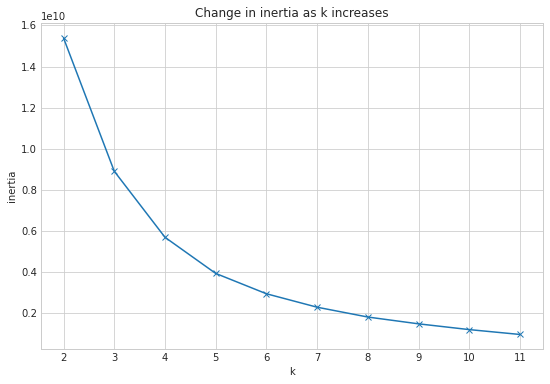

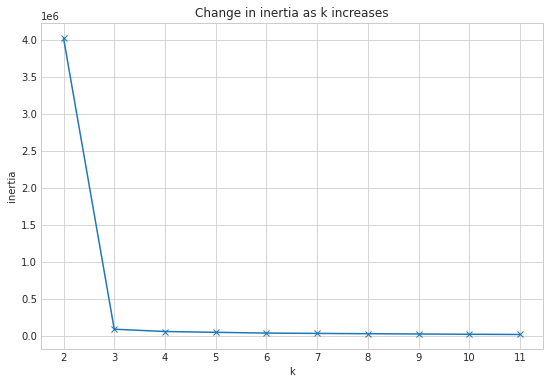

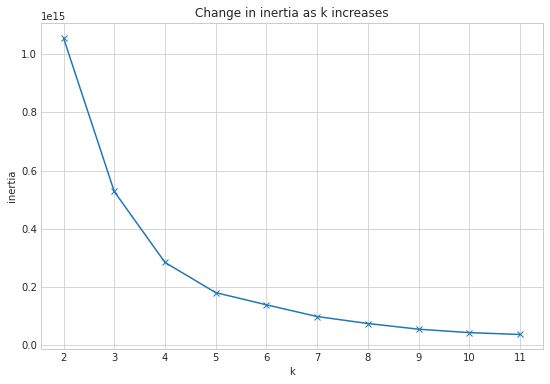

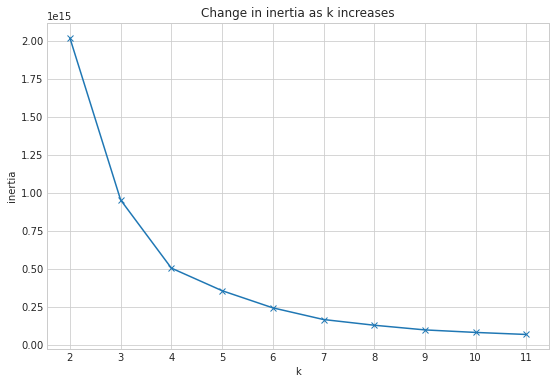

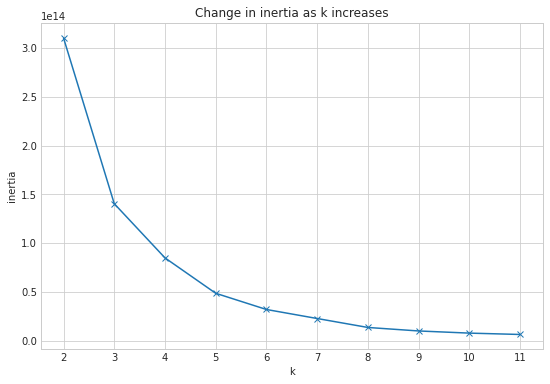

...

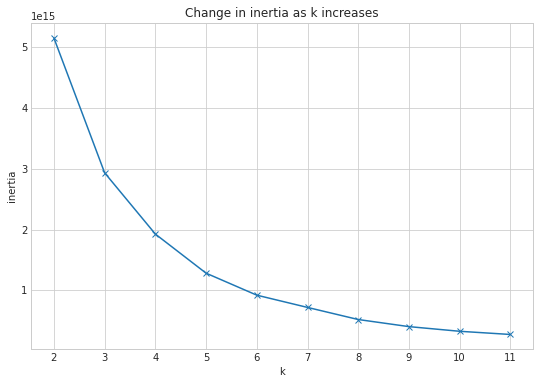

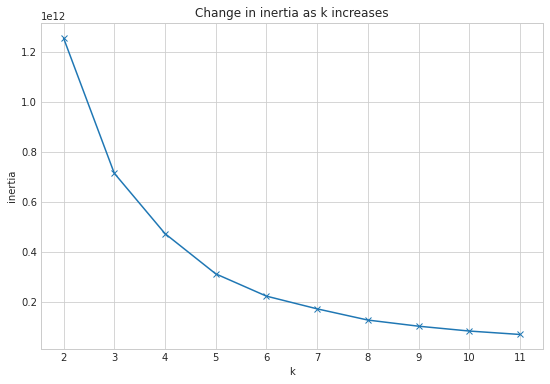

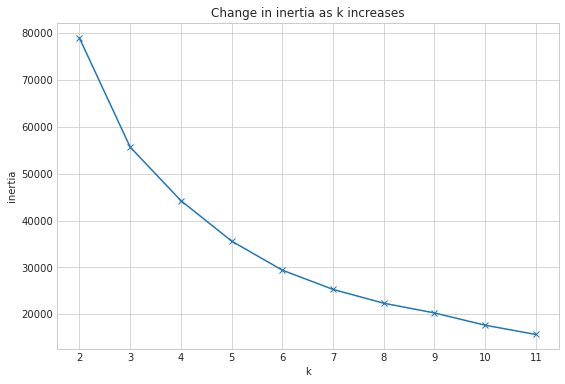

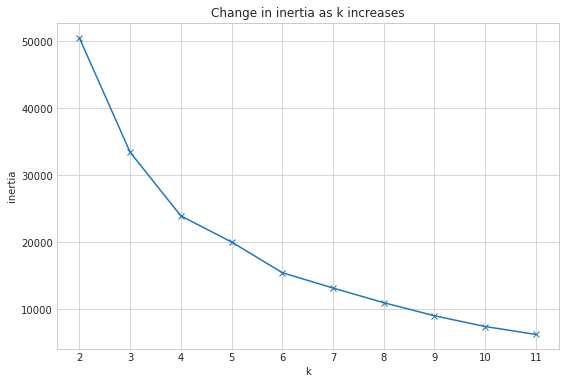

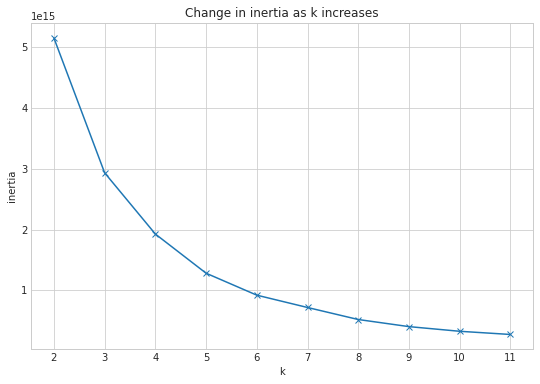

In [346]:
# plot delta(inertia) graphs for each group of clusters. Takes ~ 42.37 seconds to run on 10 clusters. Might want to ask Ryan if it's possible to cache the information that is returned.
# I'm guessing 100 dataframes will take ten times as long? Let's see: 9 minutes and 10 seconds  & CPU % up to 675
for combo in list_of_dataframes:
    with plt.style.context('seaborn-whitegrid'):
        plt.figure(figsize=(9, 6))
        pd.Series({k: KMeans(k).fit(combo).inertia_ for k in range(2, 12)}).plot(marker='x')
        plt.xticks(range(2, 12))
        plt.xlabel('k')
        plt.ylabel('inertia')
        plt.title('Change in inertia as k increases')
        

#### Determine k value for each group:
1: k = 5
2: k = 3
3: k = 5
4: k = 4
5: k = 4
6: k = 5
7: k = 4
8: k = 4
9: k = 4
10: k = 5

In [528]:
# Create a list for the k values to pass into a for loop.
number_of_centroids = [5,3,4,4,4,5,4,4,5,4,5,5,5,4,4,4,4,4,4,4,4,4,4,4,4,4,4,4,4,4,3,4,4,4,3,4,4,3,3,4,6,4,5,4,6,5,4,4,4,5,4,5,4,6,6,4,5,4,4,4,4,5,7,4,5,5,4,5,5,4,4,6,4,3,4,3,5,4,4,4,3,3,4,4,3,4,3,4,4,4,3,3,3,3,3,3,3,4,4,3]

In [529]:
len(number_of_centroids)

100

In [216]:
*** list_of_dataframes ***

[       bathroomcnt  bedroomcnt  calculatedfinishedsquarefeet
 45257          1.0         2.0                        1148.0
 54021          2.0         2.0                         898.0
 71314          1.0         1.0                        1010.0
 8173           2.0         3.0                        1218.0
 20821          1.0         1.0                         835.0
 ...            ...         ...                           ...
 1261           2.0         3.0                        1054.0
 15118          3.0         4.0                        2252.0
 54436          2.5         5.0                        1992.0
 19528          3.0         2.0                        1253.0
 9184           3.0         2.0                        1377.0
 
 [42963 rows x 3 columns],
        bathroomcnt  bedroomcnt    fips
 45257          1.0         2.0  6037.0
 54021          2.0         2.0  6037.0
 71314          1.0         1.0  6037.0
 8173           2.0         3.0  6037.0
 20821          1.0        

In [532]:
X_train_scaled.info(), X_validate_scaled.info(), X_test_scaled.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 43385 entries, 12706 to 61020
Data columns (total 17 columns):
 #   Column                        Non-Null Count  Dtype  
---  ------                        --------------  -----  
 0   bathroomcnt                   43385 non-null  float64
 1   bedroomcnt                    43385 non-null  float64
 2   calculatedfinishedsquarefeet  43385 non-null  float64
 3   fips                          43385 non-null  float64
 4   latitude                      43385 non-null  float64
 5   longitude                     43385 non-null  float64
 6   lotsizesquarefeet             43385 non-null  float64
 7   roomcnt                       43385 non-null  float64
 8   yearbuilt                     43385 non-null  float64
 9   structuretaxvaluedollarcnt    43385 non-null  float64
 10  taxvaluedollarcnt             43385 non-null  float64
 11  assessmentyear                43385 non-null  float64
 12  landtaxvaluedollarcnt         43385 non-null  float64
 1

(None, None, None)

In [535]:
# This cell will iterate through the list of dataframes and fit the kmeans with the specified number of centroids extracted from the [{inertia vs k}] graphs above.

# This cell takes ~ 30 seconds  to render with 100 clusters.

# set i to be thea iteration count for number_of_centroids index
# set n to be the iteration count for list_of_dataframes index
i = 0
k = 0
s = 0
list_of_cluster_predictions = []
for combo in list_of_dataframes: 
    kmeans = KMeans(n_clusters = number_of_centroids[k])
    kmeans.fit(list_of_dataframes[i])
    X_train_scaled['cluster_' + str(s)] = kmeans.predict(combo)
    list_of_cluster_predictions.append(kmeans.predict(list_of_dataframes[i]))
    i += 1
    k += 1
    s += 1



In [536]:
# This took about a minute to render (200+ columns)
X_train_scaled

,bathroomcnt,bedroomcnt,calculatedfinishedsquarefeet,fips,latitude,longitude,lotsizesquarefeet,roomcnt,yearbuilt,structuretaxvaluedollarcnt,...,cluster_90,cluster_91,cluster_92,cluster_93,cluster_94,cluster_95,cluster_96,cluster_97,cluster_98,cluster_99
12706,0.227273,0.250000,0.033566,0.297297,0.250567,0.803754,0.000156,0.428571,0.659420,0.007542,...,1,2,0,0,2,2,0,2,2,1
38400,0.181818,0.333333,0.030806,0.000000,0.534414,0.851703,0.000850,0.000000,0.557971,0.003571,...,0,0,1,0,0,0,1,1,0,0
75067,0.181818,0.166667,0.035228,0.000000,0.473307,0.481406,0.029285,0.000000,0.615942,0.039544,...,0,0,1,0,1,0,1,2,3,0
68921,0.227273,0.250000,0.067498,0.297297,0.257301,0.888805,0.000521,0.000000,0.891304,0.021109,...,1,2,0,1,2,2,0,0,2,1
14454,0.272727,0.333333,0.059022,0.297297,0.302190,0.758920,0.000870,0.428571,0.905797,0.016071,...,1,2,0,1,2,2,0,0,2,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
17368,0.090909,0.166667,0.025907,0.000000,0.553478,0.656214,0.000976,0.000000,0.557971,0.006737,...,0,0,1,0,0,0,1,1,0,0
24249,0.181818,0.166667,0.028610,0.000000,0.554636,0.504370,0.003746,0.000000,0.615942,0.010861,...,0,0,1,0,1,0,1,2,3,0
9322,0.181818,0.250000,0.039958,0.297297,0.201021,0.832629,0.000335,0.428571,0.623188,0.009363,...,0,0,1,0,2,0,1,2,2,0
1991,0.227273,0.250000,0.040690,1.000000,0.560217,0.170145,0.000130,0.500000,0.753623,0.015220,...,1,2,0,1,1,2,0,2,3,1


# Second Hundred 

## This is the first half of the process:

In [537]:
# Running this cell took 10 minutes and 03.95 seconds. CPU % ~ 730 for this cell.
# Create a list of the 100 features.
list_of_hundred_features = []
for combo in second_hundred:
    list_of_hundred_features.append(list(combo))
# Convert into dataframes.
list_of_dataframes = []
for combo in list_of_hundred_features:
    list_of_dataframes.append(X_train_scaled[combo])

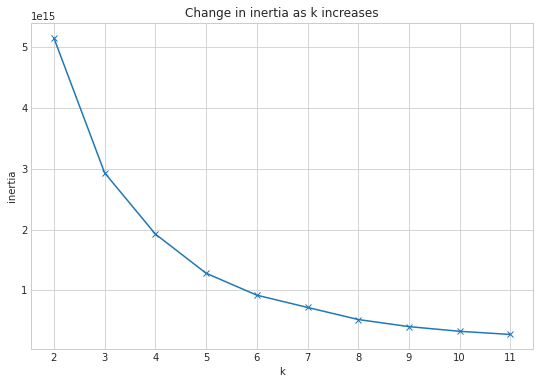

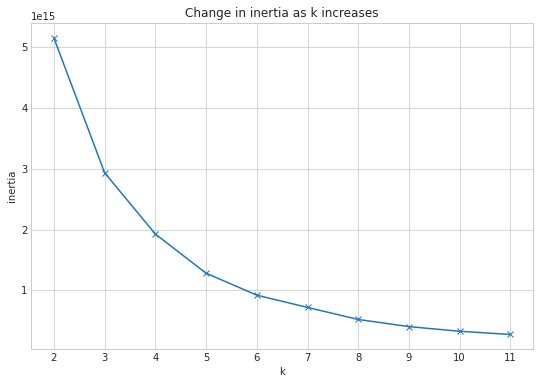

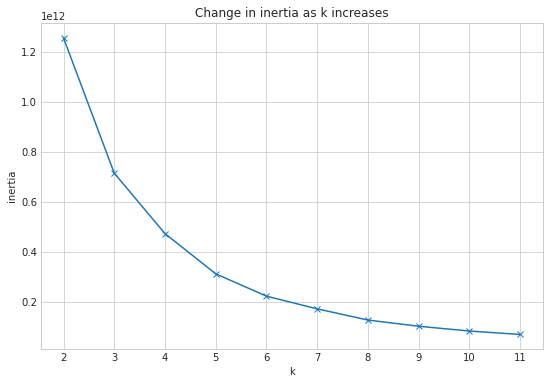

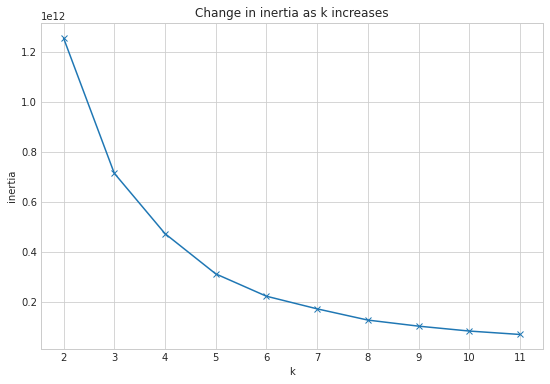

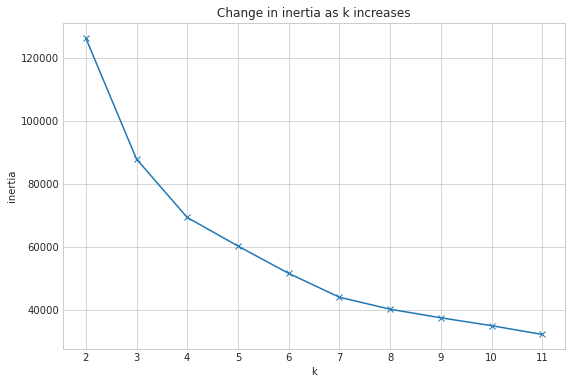

...

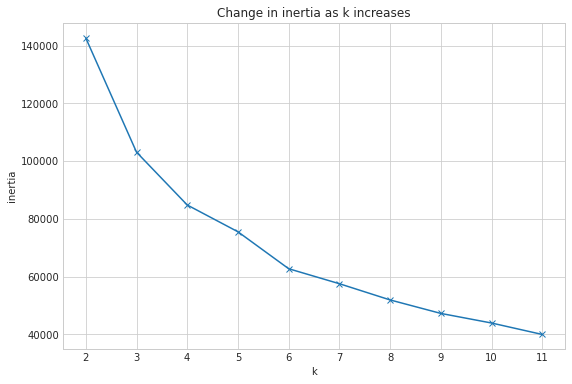

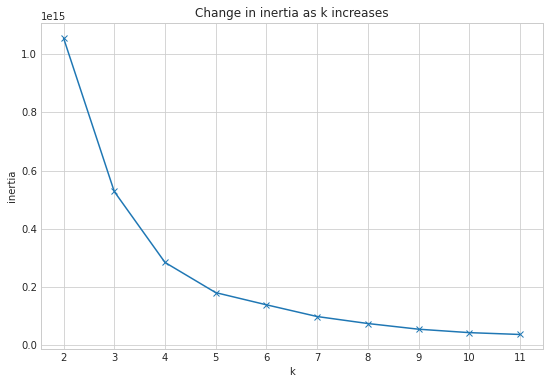

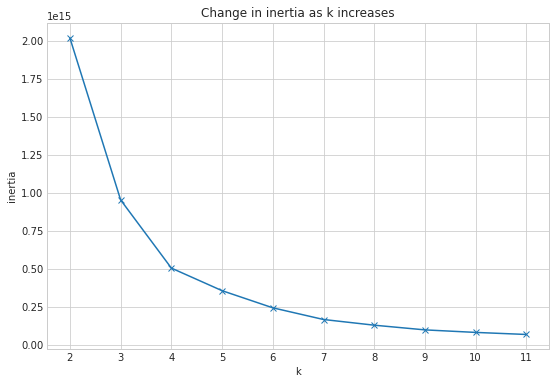

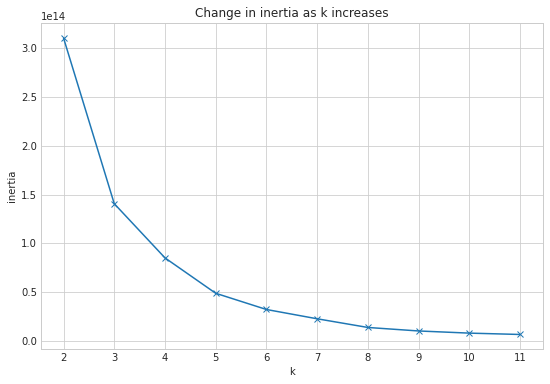

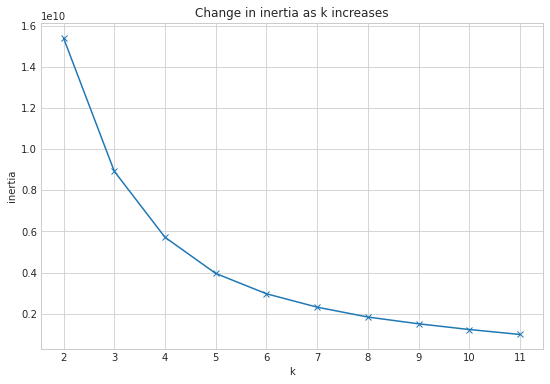

In [375]:

# plot delta(inertia) graphs for each group of clusters. Takes ~ 42.37 seconds to run on 10 clusters. Might want to ask Ryan if it's possible to cache the information that is returned.
# 100 dataframes will take ~ 9 minutes and 10 seconds to render  & CPU % up to 675
# *** ONLY RUN IF YOU HAVE TIME! ***
for combo in list_of_dataframes:
    with plt.style.context('seaborn-whitegrid'):
        plt.figure(figsize=(9, 6))
        pd.Series({k: KMeans(k).fit(combo).inertia_ for k in range(2, 12)}).plot(marker='x')
        plt.xticks(range(2, 12))
        plt.xlabel('k')
        plt.ylabel('inertia')
        plt.title('Change in inertia as k increases')



In [538]:
number_of_centroids = [4,4,4,4,4,4,4,4,4,4,4,4,3,3,4,4,4,4,4,4,3,3,3,4,4,3,3,4,3,3,2,3,4,4,3,3,3,4,4,4,4,4,3,4,4,4,4,3,4,4,4,3,3,3,3,3,3,4,3,4,4,4,4,4,4,4,3,5,4,4,4,4,4,4,4,4,4,4,4,4,4,4,4,4,4,4,4,4,4,3,4,4,3,3,4,4,4,4,5,3]



In [539]:
len(number_of_centroids)

100

## This is the second half of the process. You can't proceed with this until you get the k-values from the first half of the process.

In [540]:
# This cell will iterate through the list of dataframes and fit the kmeans with the specified number of centroids extracted from the [{inertia vs k}] graphs above.

# This cell takes ~ 30 seconds  to render with 100 clusters.
# set i to be the iteration count for number_of_centroids index
# set n to be the iteration count for list_of_dataframes index
i = 0
k = 0
s = 100
list_of_cluster_predictions = []
for combo in list_of_dataframes: 
    kmeans = KMeans(n_clusters = number_of_centroids[k])
    kmeans.fit(list_of_dataframes[i])
    X_train_scaled['cluster_' + str(s)] = kmeans.predict(combo)
    list_of_cluster_predictions.append(kmeans.predict(list_of_dataframes[i]))
    i += 1
    k += 1
    s += 1

# Third Hundred

### First half of the process:

In [541]:
# Create a list of the 100 features.
list_of_hundred_features = []
for combo in third_hundred:
    list_of_hundred_features.append(list(combo))
# Convert into dataframes.
list_of_dataframes = []
for combo in list_of_hundred_features:
    list_of_dataframes.append(X_train_scaled[combo])

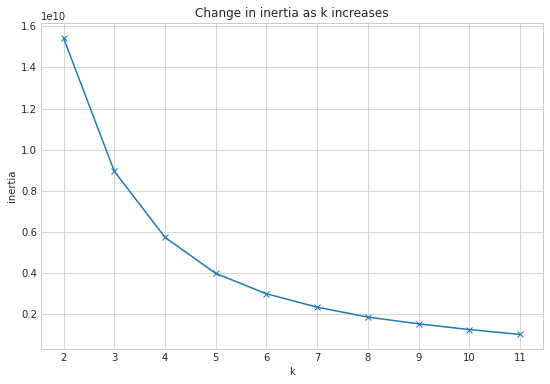

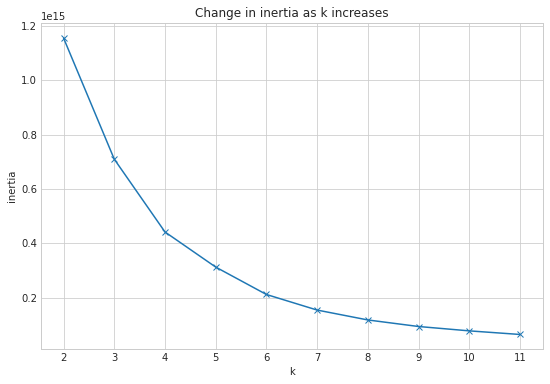

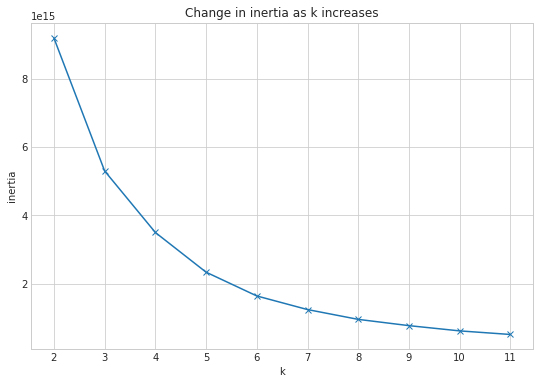

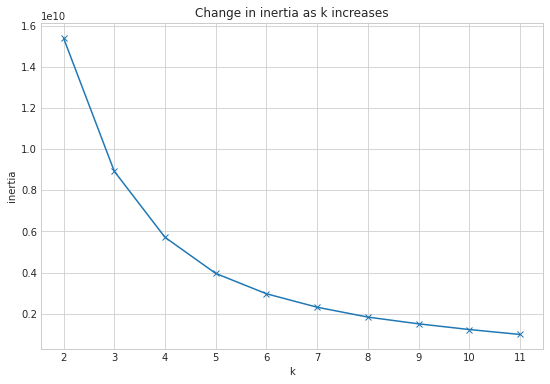

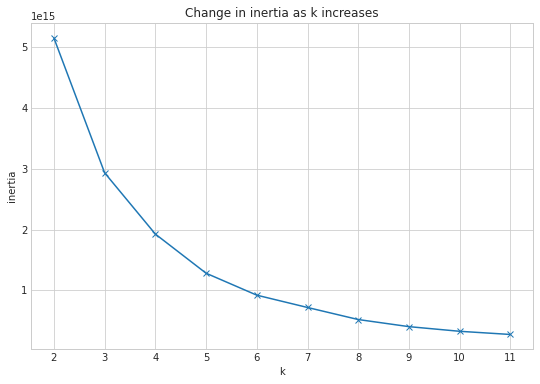

...

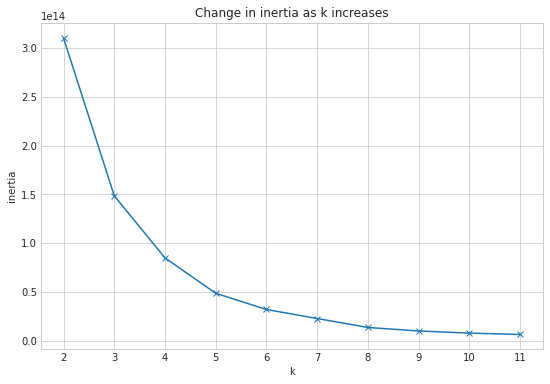

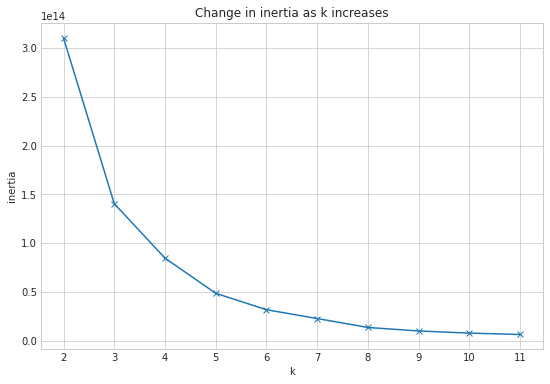

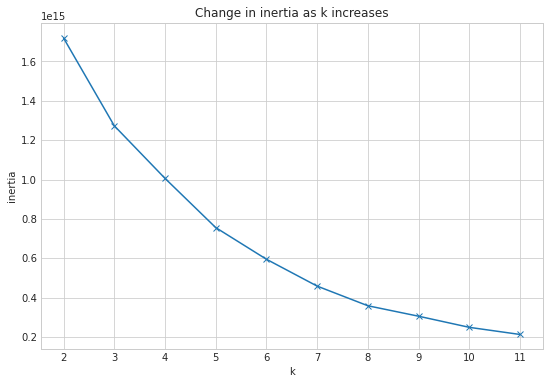

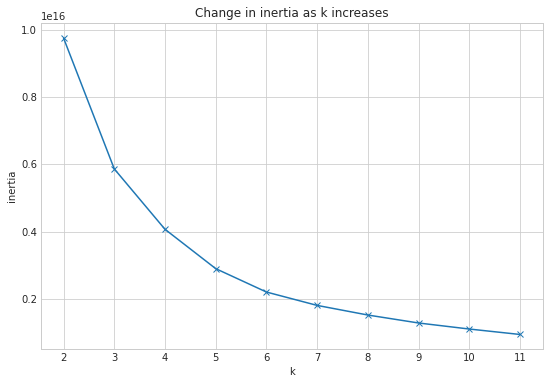

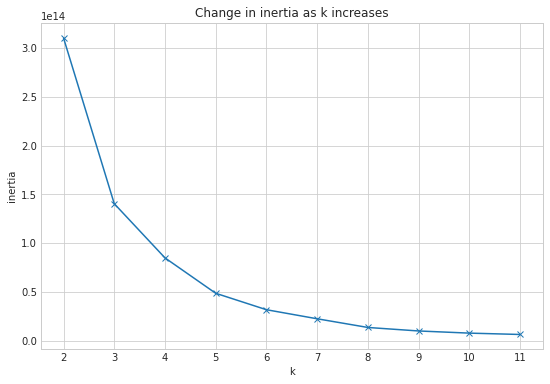

In [386]:
# plot delta(inertia) graphs for each group of clusters. Takes ~ 42.37 seconds to run on 10 clusters. Might want to ask Ryan if it's possible to cache the information that is returned.
# 100 dataframes will take ~ 9 minutes and 10 seconds to render  & CPU % up to 675
# *** ONLY RUN IF YOU HAVE TIME! ***
for combo in list_of_dataframes:
    with plt.style.context('seaborn-whitegrid'):
        plt.figure(figsize=(9, 6))
        pd.Series({k: KMeans(k).fit(combo).inertia_ for k in range(2, 12)}).plot(marker='x')
        plt.xticks(range(2, 12))
        plt.xlabel('k')
        plt.ylabel('inertia')
        plt.title('Change in inertia as k increases')

In [542]:
number_of_centroids = [4,4,5,4,4,4,4,4,3,5,4,4,3,3,4,4,4,4,4,4,4,4,4,4,4,4,4,3,3,3,4,3,4,3,3,4,4,4,4,4,4,4,4,4,4,4,3,3,4,3,4,3,4,4,4,4,4,4,4,3,3,4,3,4,3,4,4,3,3,4,4,3,3,4,4,3,4,3,3,3,4,4,4,4,4,4,4,4,4,4,4,3,3,4,3,3,4,2,3,3]

len(number_of_centroids)

100

In [543]:
X_train_scaled

,bathroomcnt,bedroomcnt,calculatedfinishedsquarefeet,fips,latitude,longitude,lotsizesquarefeet,roomcnt,yearbuilt,structuretaxvaluedollarcnt,...,cluster_190,cluster_191,cluster_192,cluster_193,cluster_194,cluster_195,cluster_196,cluster_197,cluster_198,cluster_199
12706,0.227273,0.250000,0.033566,0.297297,0.250567,0.803754,0.000156,0.428571,0.659420,0.007542,...,2,0,2,1,2,2,0,0,2,2
38400,0.181818,0.333333,0.030806,0.000000,0.534414,0.851703,0.000850,0.000000,0.557971,0.003571,...,0,3,0,1,0,2,1,3,3,0
75067,0.181818,0.166667,0.035228,0.000000,0.473307,0.481406,0.029285,0.000000,0.615942,0.039544,...,1,0,1,1,3,2,1,1,3,0
68921,0.227273,0.250000,0.067498,0.297297,0.257301,0.888805,0.000521,0.000000,0.891304,0.021109,...,2,1,2,0,2,3,0,0,4,0
14454,0.272727,0.333333,0.059022,0.297297,0.302190,0.758920,0.000870,0.428571,0.905797,0.016071,...,0,1,2,0,2,3,0,0,2,2
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
17368,0.090909,0.166667,0.025907,0.000000,0.553478,0.656214,0.000976,0.000000,0.557971,0.006737,...,1,3,0,1,0,2,1,3,3,0
24249,0.181818,0.166667,0.028610,0.000000,0.554636,0.504370,0.003746,0.000000,0.615942,0.010861,...,1,0,1,1,3,2,1,1,3,0
9322,0.181818,0.250000,0.039958,0.297297,0.201021,0.832629,0.000335,0.428571,0.623188,0.009363,...,2,0,2,1,2,2,0,0,2,2
1991,0.227273,0.250000,0.040690,1.000000,0.560217,0.170145,0.000130,0.500000,0.753623,0.015220,...,2,0,1,0,3,0,2,2,1,1


### Second half of the process:

In [544]:
# This cell will iterate through the list of dataframes and fit the kmeans with the specified number of centroids extracted from the [{inertia vs k}] graphs above.

# This cell takes ~ 30 seconds  to render with 100 clusters.
# set i to be the iteration count for number_of_centroids index
# set n to be the iteration count for list_of_dataframes index
i = 0
k = 0
s = 200
list_of_cluster_predictions = []
for combo in list_of_dataframes: 
    kmeans = KMeans(n_clusters = number_of_centroids[k])
    kmeans.fit(list_of_dataframes[i])
    X_train_scaled['cluster_' + str(s)] = kmeans.predict(combo)
    list_of_cluster_predictions.append(kmeans.predict(list_of_dataframes[i]))
    i += 1
    k += 1
    s += 1


In [545]:
X_train_scaled

,bathroomcnt,bedroomcnt,calculatedfinishedsquarefeet,fips,latitude,longitude,lotsizesquarefeet,roomcnt,yearbuilt,structuretaxvaluedollarcnt,...,cluster_290,cluster_291,cluster_292,cluster_293,cluster_294,cluster_295,cluster_296,cluster_297,cluster_298,cluster_299
12706,0.227273,0.250000,0.033566,0.297297,0.250567,0.803754,0.000156,0.428571,0.659420,0.007542,...,3,2,0,1,1,1,2,0,2,2
38400,0.181818,0.333333,0.030806,0.000000,0.534414,0.851703,0.000850,0.000000,0.557971,0.003571,...,0,0,2,3,2,0,0,0,0,0
75067,0.181818,0.166667,0.035228,0.000000,0.473307,0.481406,0.029285,0.000000,0.615942,0.039544,...,2,0,2,1,0,0,0,0,0,0
68921,0.227273,0.250000,0.067498,0.297297,0.257301,0.888805,0.000521,0.000000,0.891304,0.021109,...,3,2,0,2,1,0,2,0,2,2
14454,0.272727,0.333333,0.059022,0.297297,0.302190,0.758920,0.000870,0.428571,0.905797,0.016071,...,3,2,0,2,1,1,2,0,2,2
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
17368,0.090909,0.166667,0.025907,0.000000,0.553478,0.656214,0.000976,0.000000,0.557971,0.006737,...,0,0,2,3,2,0,0,0,0,0
24249,0.181818,0.166667,0.028610,0.000000,0.554636,0.504370,0.003746,0.000000,0.615942,0.010861,...,2,0,2,1,0,0,0,0,0,0
9322,0.181818,0.250000,0.039958,0.297297,0.201021,0.832629,0.000335,0.428571,0.623188,0.009363,...,3,2,0,1,1,1,2,0,2,2
1991,0.227273,0.250000,0.040690,1.000000,0.560217,0.170145,0.000130,0.500000,0.753623,0.015220,...,1,1,1,1,0,2,1,1,1,1


# Fourth Hundred

### First half of process:

In [546]:
# Running this cell took 11 minutes and 55.51 seconds. CPU % ~ 730 for this cell.
# Create a list of the 100 features.
list_of_hundred_features = []
for combo in fourth_hundred:
    list_of_hundred_features.append(list(combo))
# Convert into dataframes.
list_of_dataframes = []
for combo in list_of_hundred_features:
    list_of_dataframes.append(X_train_scaled[combo])

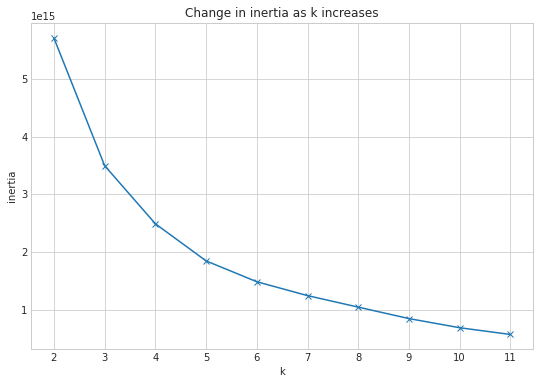

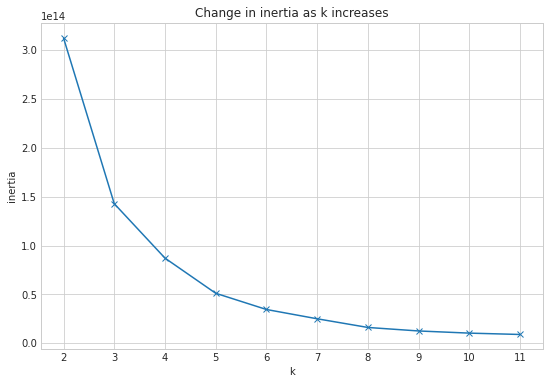

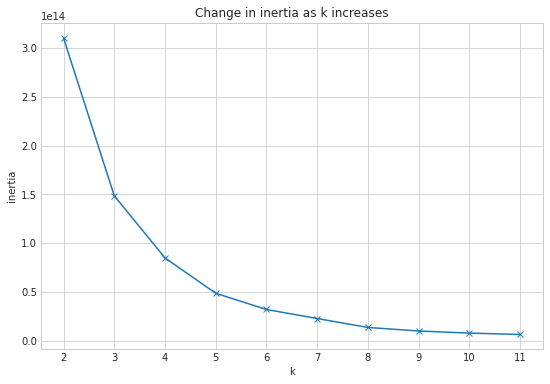

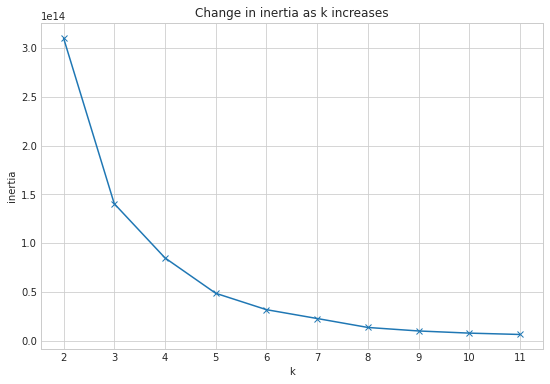

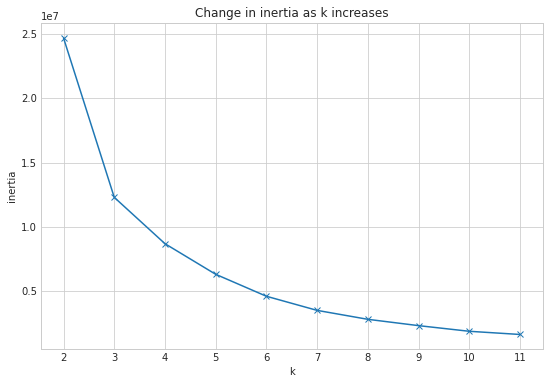

...

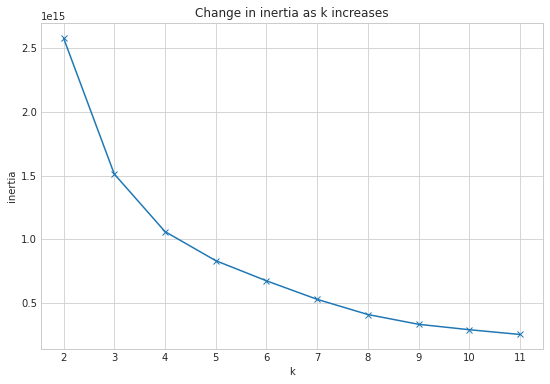

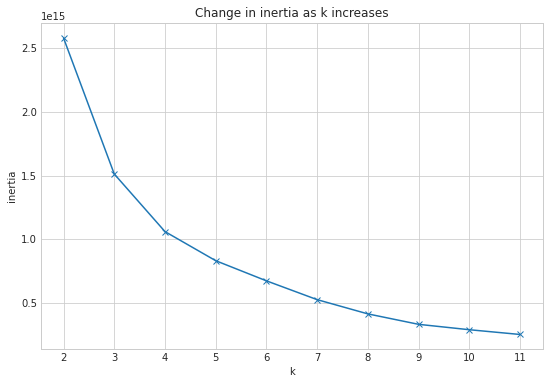

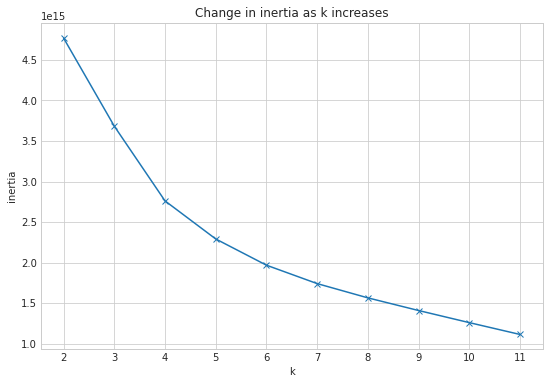

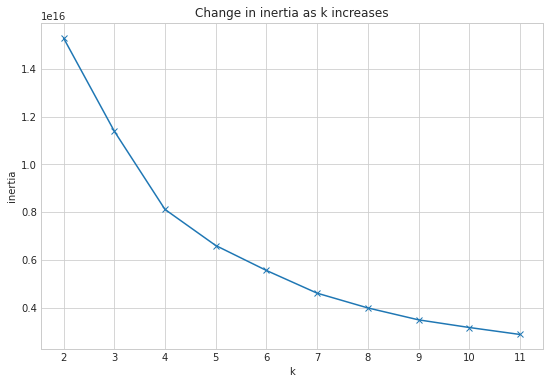

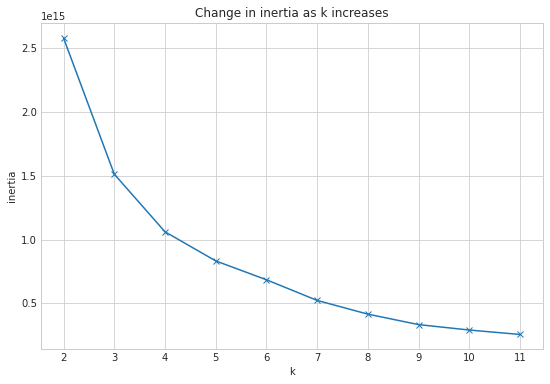

In [387]:
# plot delta(inertia) graphs for each group of clusters. Takes ~ 42.37 seconds to run on 10 clusters. Might want to ask Ryan if it's possible to cache the information that is returned.
# 100 dataframes will take ~ 9 minutes and 10 seconds to render  & CPU % up to 675
# *** ONLY RUN IF YOU HAVE TIME! ***
for combo in list_of_dataframes:
    with plt.style.context('seaborn-whitegrid'):
        plt.figure(figsize=(9, 6))
        pd.Series({k: KMeans(k).fit(combo).inertia_ for k in range(2, 12)}).plot(marker='x')
        plt.xticks(range(2, 12))
        plt.xlabel('k')
        plt.ylabel('inertia')
        plt.title('Change in inertia as k increases')

In [547]:
number_of_centroids = [4,4,3,3,3,4,4,3,3,3,3,3,4,4,3,4,4,3,3,3,4,4,4,4,4,4,4,3,3,3,3,3,3,3,3,4,3,4,3,3,4,3,2,2,4,3,3,4,4,4,3,3,4,5,3,4,3,3,3,4,3,3,4,4,3,3,3,3,3,4,4,3,4,4,3,3,4,4,4,3,3,4,3,3,3,4,4,3,3,4,4,4,3,3,4,4,3,4,4,4]

len(number_of_centroids)

100

### Second half of process:

In [548]:
# This cell will iterate through the list of dataframes and fit the kmeans with the specified number of centroids extracted from the [{inertia vs k}] graphs above.

# This cell takes ~ 30 seconds  to render with 100 clusters.
# set i to be the iteration count for number_of_centroids index
# set n to be the iteration count for list_of_dataframes index
i = 0
k = 0
s = 300
list_of_cluster_predictions = []
for combo in list_of_dataframes: 
    kmeans = KMeans(n_clusters = number_of_centroids[k])
    kmeans.fit(list_of_dataframes[i])
    X_train_scaled['cluster_' + str(s)] = kmeans.predict(combo)
    list_of_cluster_predictions.append(kmeans.predict(list_of_dataframes[i]))
    i += 1
    k += 1
    s += 1


In [549]:
X_train_scaled

,bathroomcnt,bedroomcnt,calculatedfinishedsquarefeet,fips,latitude,longitude,lotsizesquarefeet,roomcnt,yearbuilt,structuretaxvaluedollarcnt,...,cluster_390,cluster_391,cluster_392,cluster_393,cluster_394,cluster_395,cluster_396,cluster_397,cluster_398,cluster_399
12706,0.227273,0.250000,0.033566,0.297297,0.250567,0.803754,0.000156,0.428571,0.659420,0.007542,...,0,2,1,2,1,2,2,1,3,1
38400,0.181818,0.333333,0.030806,0.000000,0.534414,0.851703,0.000850,0.000000,0.557971,0.003571,...,3,1,1,0,1,0,2,1,3,1
75067,0.181818,0.166667,0.035228,0.000000,0.473307,0.481406,0.029285,0.000000,0.615942,0.039544,...,0,3,1,1,1,3,1,0,2,0
68921,0.227273,0.250000,0.067498,0.297297,0.257301,0.888805,0.000521,0.000000,0.891304,0.021109,...,1,2,0,2,2,0,2,1,3,1
14454,0.272727,0.333333,0.059022,0.297297,0.302190,0.758920,0.000870,0.428571,0.905797,0.016071,...,1,2,0,2,2,2,2,3,1,3
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
17368,0.090909,0.166667,0.025907,0.000000,0.553478,0.656214,0.000976,0.000000,0.557971,0.006737,...,3,1,1,0,1,3,0,3,1,3
24249,0.181818,0.166667,0.028610,0.000000,0.554636,0.504370,0.003746,0.000000,0.615942,0.010861,...,0,3,1,1,1,3,1,0,2,0
9322,0.181818,0.250000,0.039958,0.297297,0.201021,0.832629,0.000335,0.428571,0.623188,0.009363,...,0,2,1,2,1,2,2,1,3,1
1991,0.227273,0.250000,0.040690,1.000000,0.560217,0.170145,0.000130,0.500000,0.753623,0.015220,...,0,3,0,1,0,1,1,2,0,2


# Fifth Hundred

### First half of process:

In [550]:
# Create a list of the 100 features.
list_of_hundred_features = []
for combo in fifth_hundred:
    list_of_hundred_features.append(list(combo))
# Convert into dataframes.
list_of_dataframes = []
for combo in list_of_hundred_features:
    list_of_dataframes.append(X_train_scaled[combo])

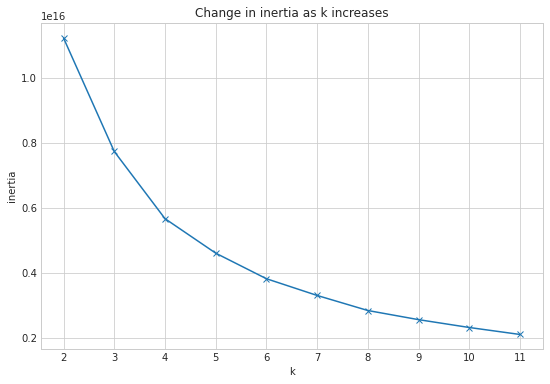

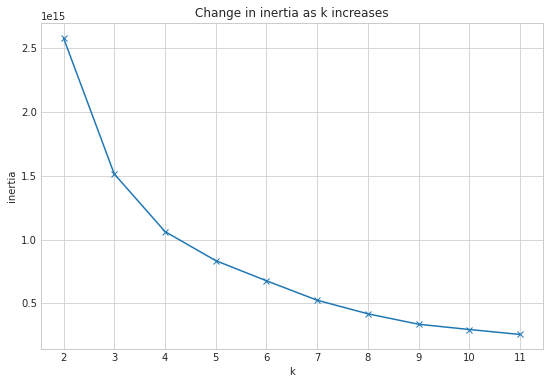

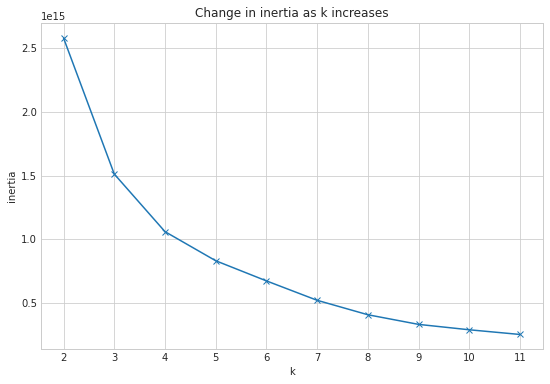

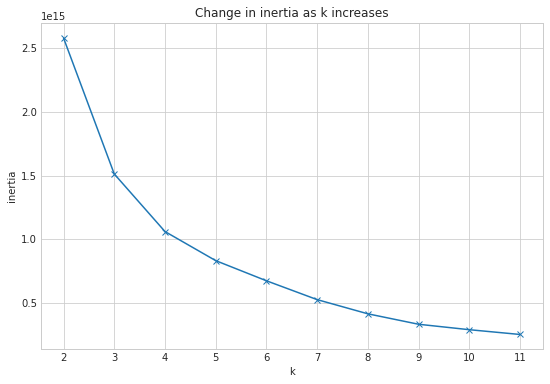

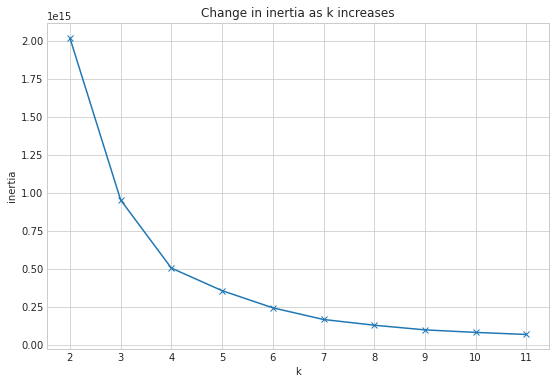

...

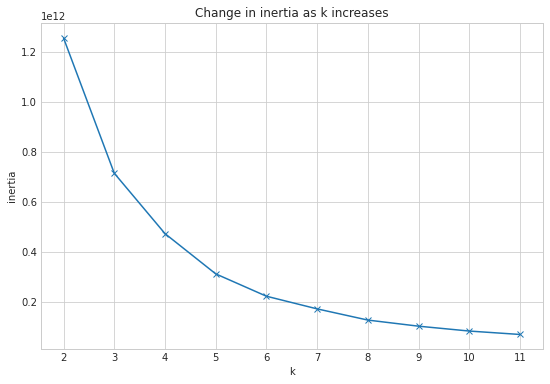

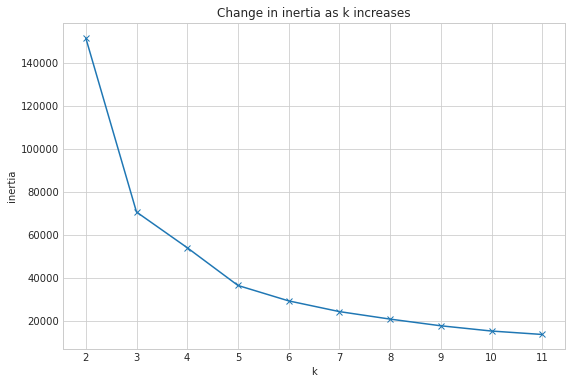

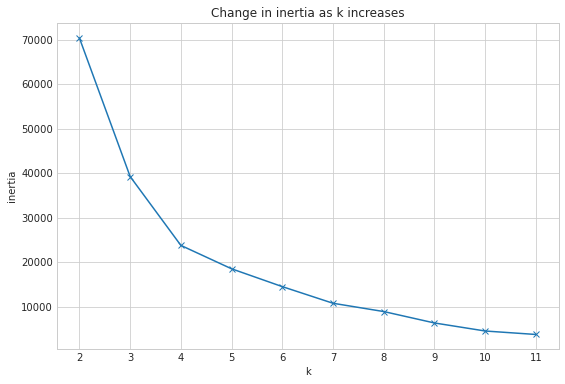

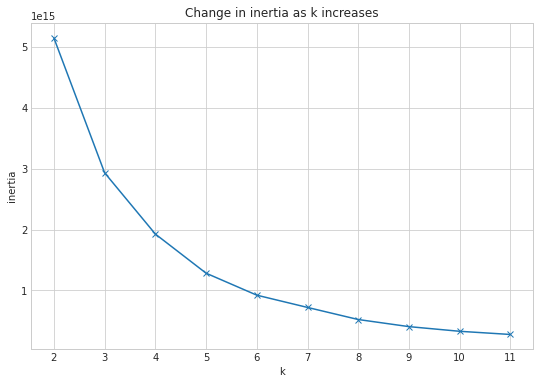

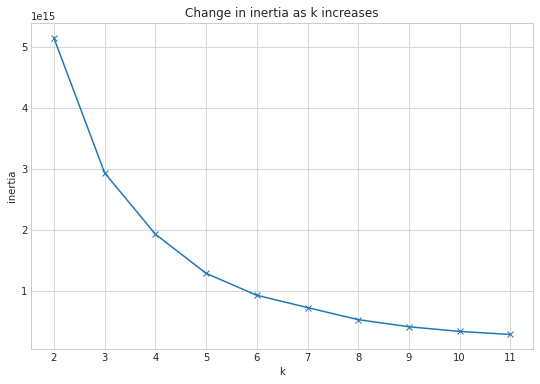

In [390]:
# plot delta(inertia) graphs for each group of clusters. Takes ~ 42.37 seconds to run on 10 clusters. Might want to ask Ryan if it's possible to cache the information that is returned.
# 100 dataframes will take ~ 9 minutes and 10 seconds to render  & CPU % up to 675
# *** ONLY RUN IF YOU HAVE TIME! ***
for combo in list_of_dataframes:
    with plt.style.context('seaborn-whitegrid'):
        plt.figure(figsize=(9, 6))
        pd.Series({k: KMeans(k).fit(combo).inertia_ for k in range(2, 12)}).plot(marker='x')
        plt.xticks(range(2, 12))
        plt.xlabel('k')
        plt.ylabel('inertia')
        plt.title('Change in inertia as k increases')

In [551]:
number_of_centroids = [4,4,4,4,4,4,4,3,4,4,3,4,4,4,3,4,4,4,4,4,4,4,4,4,4,4,4,4,4,4,4,4,3,4,4,3,3,3,3,3,4,2,3,3,3,3,3,3,2,3,3,3,3,3,3,3,3,3,2,3,2,3,4,4,3,3,4,4,3,3,4,4,4,3,3,4,4,4,4,4,3,4,3,3,4,3,4,4,4,3,3,4,4,3,4,4,3,4,3,3]

len(number_of_centroids)

100

### Second half of the process:

In [552]:
# This cell will iterate through the list of dataframes and fit the kmeans with the specified number of centroids extracted from the [{inertia vs k}] graphs above.

# This cell takes ~ 30 seconds  to render with 100 clusters.
# set i to be the iteration count for number_of_centroids index
# set n to be the iteration count for list_of_dataframes index
i = 0
k = 0
s = 400
list_of_cluster_predictions = []
for combo in list_of_dataframes: 
    kmeans = KMeans(n_clusters = number_of_centroids[k])
    kmeans.fit(list_of_dataframes[i])
    X_train_scaled['cluster_' + str(s)] = kmeans.predict(combo)
    list_of_cluster_predictions.append(kmeans.predict(list_of_dataframes[i]))
    i += 1
    k += 1
    s += 1

In [407]:
X_train_scaled

,bathroomcnt,bedroomcnt,calculatedfinishedsquarefeet,fips,latitude,longitude,lotsizesquarefeet,roomcnt,yearbuilt,structuretaxvaluedollarcnt,...,cluster_450,cluster_451,cluster_452,cluster_453,cluster_454,cluster_455,cluster_456,cluster_457,cluster_458,cluster_459
45257,0.000000,0.066667,0.045736,0.000000,0.530507,0.655314,0.000830,0.000000,0.318841,0.012060,...,0,0,0,0,0,0,0,0,0,2
54021,0.083333,0.066667,0.034256,0.000000,0.525921,0.655844,0.000887,0.000000,0.500000,0.016366,...,0,0,0,0,0,0,0,0,0,2
71314,0.000000,0.000000,0.039399,0.000000,0.967247,0.625631,0.014227,0.000000,0.507246,0.007015,...,0,0,0,0,0,0,0,0,0,2
8173,0.083333,0.133333,0.048951,0.000000,0.438309,0.601772,0.000655,0.000000,0.326087,0.007187,...,0,0,0,0,0,0,0,0,0,2
20821,0.000000,0.000000,0.031363,0.000000,0.728139,0.476248,0.120794,0.000000,0.804348,0.015429,...,0,0,0,0,0,2,0,0,0,2
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1261,0.083333,0.133333,0.041420,0.297297,0.227100,0.858267,0.000698,0.357143,0.659420,0.008010,...,0,0,0,0,0,1,0,0,0,2
15118,0.166667,0.200000,0.096432,0.000000,0.559994,0.516481,0.001283,0.000000,0.557971,0.029777,...,0,0,0,0,0,0,0,0,0,2
54436,0.125000,0.266667,0.084493,0.297297,0.366778,0.773877,0.000340,0.642857,0.637681,0.005453,...,0,0,0,0,0,1,0,0,0,2
19528,0.166667,0.066667,0.050558,0.000000,0.640076,0.467774,0.007029,0.000000,0.934783,0.037487,...,0,0,0,0,0,2,0,0,0,2


# Last 60

### First half of process:

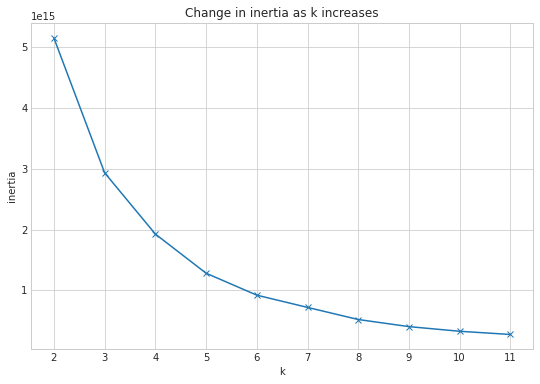

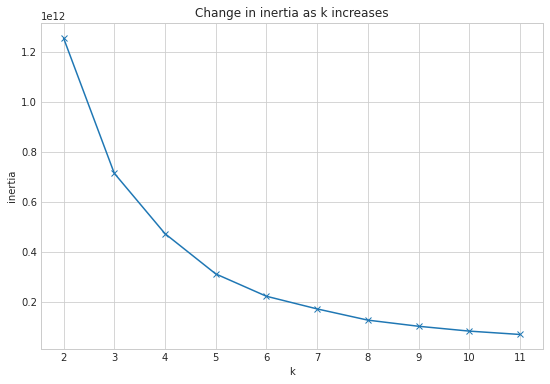

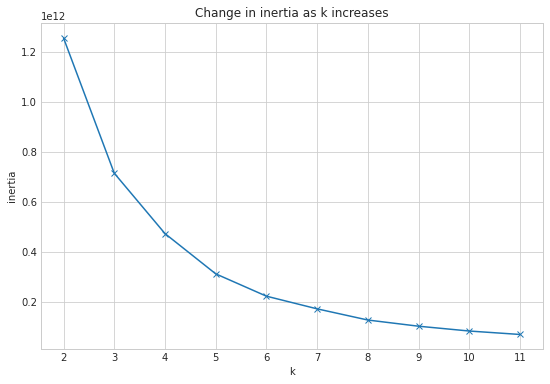

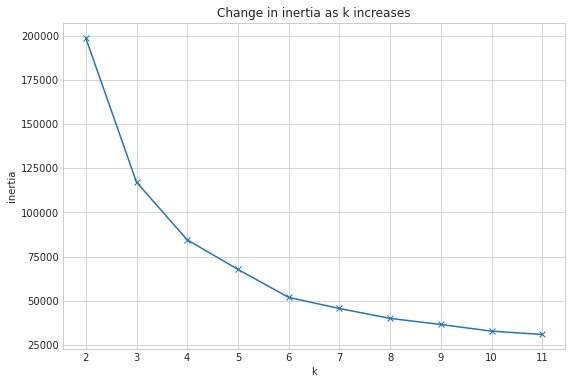

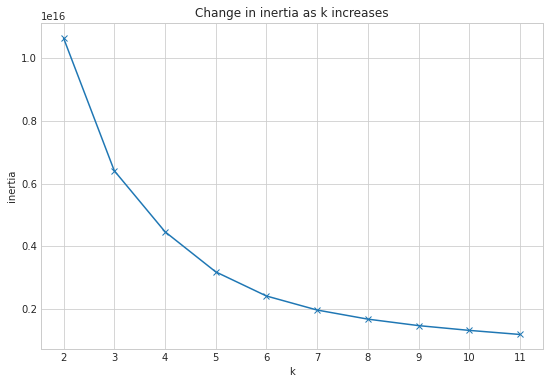

...

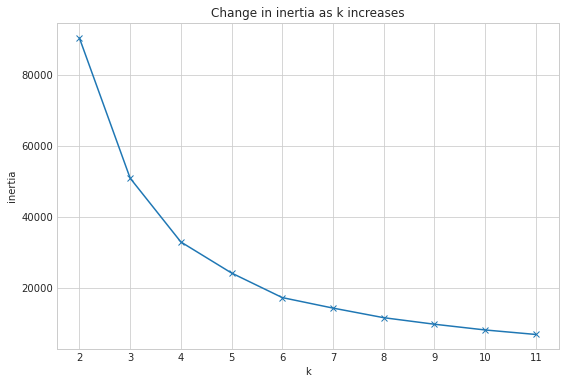

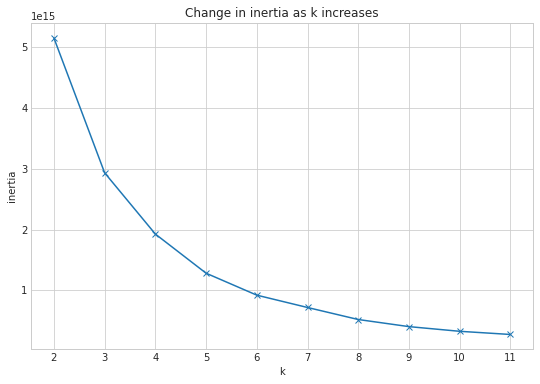

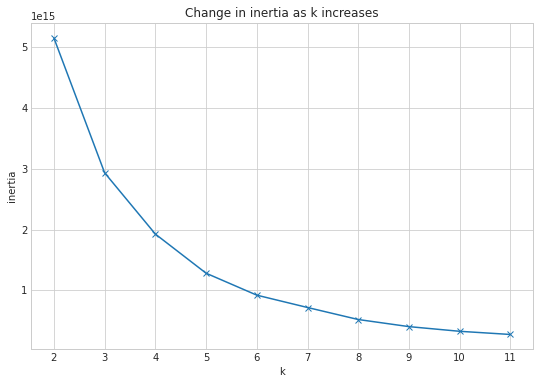

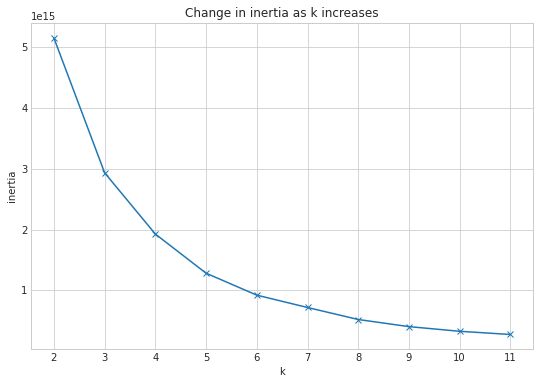

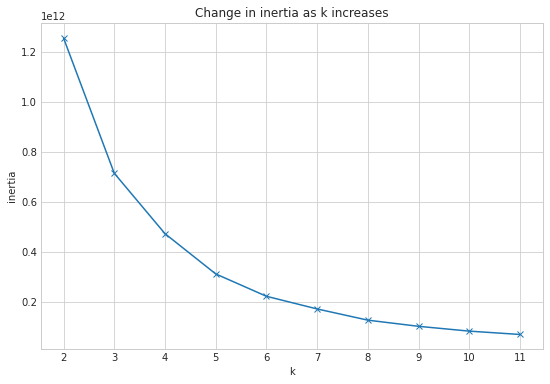

In [396]:
# Running this cell took 11 minutes and 55.51 seconds. CPU % ~ 730 for this cell.
# Create a list of the 100 features.
list_of_hundred_features = []
for combo in last_sixty:
    list_of_hundred_features.append(list(combo))
# Convert into dataframes.
list_of_dataframes = []
for combo in list_of_hundred_features:
    list_of_dataframes.append(X_train_scaled[combo])
# plot delta(inertia) graphs for each group of clusters. Takes ~ 42.37 seconds to run on 10 clusters. Might want to ask Ryan if it's possible to cache the information that is returned.
# 100 dataframes will take ~ 9 minutes and 10 seconds to render  & CPU % up to 675
# *** ONLY RUN IF YOU HAVE TIME! ***
for combo in list_of_dataframes:
    with plt.style.context('seaborn-whitegrid'):
        plt.figure(figsize=(9, 6))
        pd.Series({k: KMeans(k).fit(combo).inertia_ for k in range(2, 12)}).plot(marker='x')
        plt.xticks(range(2, 12))
        plt.xlabel('k')
        plt.ylabel('inertia')
        plt.title('Change in inertia as k increases')

In [408]:
number_of_centroids = [4,4,3,3,3,4,4,4,3,4,3,4,3,4,4,3,4,4,4,3,3,3,4,3,4,3,4,3,4,4,3,4,4,4,3,4,4,4,4,4,4,3,3,3,4,3,4,3,3,3,3,4,3,4,4,3,3,3,3,4]

len(number_of_centroids)

60

### Second half of process: 

In [409]:
# This cell will iterate through the list of dataframes and fit the kmeans with the specified number of centroids extracted from the [{inertia vs k}] graphs above.

# This cell takes ~ 30 seconds  to render with 100 clusters.
# set i to be the iteration count for number_of_centroids index
# set n to be the iteration count for list_of_dataframes index
i = 0
k = 0
s = 500
list_of_cluster_predictions = []
for combo in list_of_dataframes: 
    kmeans = KMeans(n_clusters = number_of_centroids[k])
    kmeans.fit(list_of_dataframes[i])
    X_train_scaled['cluster_' + str(s)] = kmeans.predict(combo)
    list_of_cluster_predictions.append(kmeans.predict(list_of_dataframes[i]))
    i += 1
    k += 1
    s += 1
# Initialize the linear regression object!
lm = LinearRegression()
# Initialize the RFE object, setting the hyperparameters to be our linear regression object created above
# (as the algorithm to test the features on) and the number of features to return to be 5.
rfe = RFE(lm, n_features_to_select=16)
# Fit the RFE object to our data. This means create multiple linear regression models, find the one that 
# performs best, and identify the features that are used in that model. Those are the features we want.
# Transform our X dataframe to include only those 2 features. .transform() or do both of those steps together 
# with .fit_transform()
# Transforming data using RFE.
X_rfe = rfe.fit_transform(X_train_scaled,y_train)  
#Fitting the data to model.
lm.fit(X_rfe,y_train)

# Create boolean mask.
mask = rfe.support_

# Store top 100 features into this variable.
rfe_features = X_train_scaled.loc[:, mask].columns.tolist()

16

In [412]:
# FINALLY FINISHED!!!
X_train_scaled

,bathroomcnt,bedroomcnt,calculatedfinishedsquarefeet,fips,latitude,longitude,lotsizesquarefeet,roomcnt,yearbuilt,structuretaxvaluedollarcnt,...,cluster_550,cluster_551,cluster_552,cluster_553,cluster_554,cluster_555,cluster_556,cluster_557,cluster_558,cluster_559
45257,0.000000,0.066667,0.045736,0.000000,0.530507,0.655314,0.000830,0.000000,0.318841,0.012060,...,0,3,1,0,0,0,0,0,1,0
54021,0.083333,0.066667,0.034256,0.000000,0.525921,0.655844,0.000887,0.000000,0.500000,0.016366,...,0,3,1,0,0,0,0,0,1,0
71314,0.000000,0.000000,0.039399,0.000000,0.967247,0.625631,0.014227,0.000000,0.507246,0.007015,...,0,0,1,0,0,0,0,0,1,0
8173,0.083333,0.133333,0.048951,0.000000,0.438309,0.601772,0.000655,0.000000,0.326087,0.007187,...,0,0,1,0,0,0,0,0,1,0
20821,0.000000,0.000000,0.031363,0.000000,0.728139,0.476248,0.120794,0.000000,0.804348,0.015429,...,0,0,1,0,0,2,0,0,1,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1261,0.083333,0.133333,0.041420,0.297297,0.227100,0.858267,0.000698,0.357143,0.659420,0.008010,...,0,3,1,0,0,1,0,0,1,0
15118,0.166667,0.200000,0.096432,0.000000,0.559994,0.516481,0.001283,0.000000,0.557971,0.029777,...,0,3,1,3,2,0,0,0,1,3
54436,0.125000,0.266667,0.084493,0.297297,0.366778,0.773877,0.000340,0.642857,0.637681,0.005453,...,0,0,1,0,0,1,0,0,1,0
19528,0.166667,0.066667,0.050558,0.000000,0.640076,0.467774,0.007029,0.000000,0.934783,0.037487,...,0,0,1,0,0,2,0,0,1,0


In [411]:
# *** ATTENTION!!!*** This cell took ~. 2 minutes to render! Run only if you have time.
# Now run X_train_scaled through the rfe regressor and see what happens.
# Initialize the linear regression object!
lm = LinearRegression()

# Initialize the RFE object, setting the hyperparameters to be our linear regression object created above
# (as the algorithm to test the features on) and the number of features to return to be 5.
rfe = RFE(lm, n_features_to_select=100)

# Fit the RFE object to our data. This means create multiple linear regression models, find the one that 
# performs best, and identify the features that are used in that model. Those are the features we want.
# Transform our X dataframe to include only those 2 features. .transform() or do both of those steps together 
# with .fit_transform()

# Transforming data using RFE
X_rfe = rfe.fit_transform(X_train_scaled,y_train) 



In [415]:
# Fit the linear regression model on our new clusters
lm.fit(X_rfe,y_train)

# Create boolean mask.
mask = rfe.support_

# Store top 100 features into this variable.
rfe_features = X_train_scaled.loc[:, mask].columns.tolist()

In [417]:
# Here are the top 100 features!  I'll try out the first 50 on the OLS model and then the last 50. Then all.
rfe_features
first_fifty = rfe_features[0:50]
last_fifty = rfe_features[50:]

,bathroomcnt,bedroomcnt,calculatedfinishedsquarefeet,fips,latitude,longitude,lotsizesquarefeet,roomcnt,yearbuilt,structuretaxvaluedollarcnt,...,cluster_550,cluster_551,cluster_552,cluster_553,cluster_554,cluster_555,cluster_556,cluster_557,cluster_558,cluster_559
45257,0.000000,0.066667,0.045736,0.000000,0.530507,0.655314,0.000830,0.000000,0.318841,0.012060,...,0,3,1,0,0,0,0,0,1,0
54021,0.083333,0.066667,0.034256,0.000000,0.525921,0.655844,0.000887,0.000000,0.500000,0.016366,...,0,3,1,0,0,0,0,0,1,0
71314,0.000000,0.000000,0.039399,0.000000,0.967247,0.625631,0.014227,0.000000,0.507246,0.007015,...,0,0,1,0,0,0,0,0,1,0
8173,0.083333,0.133333,0.048951,0.000000,0.438309,0.601772,0.000655,0.000000,0.326087,0.007187,...,0,0,1,0,0,0,0,0,1,0
20821,0.000000,0.000000,0.031363,0.000000,0.728139,0.476248,0.120794,0.000000,0.804348,0.015429,...,0,0,1,0,0,2,0,0,1,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1261,0.083333,0.133333,0.041420,0.297297,0.227100,0.858267,0.000698,0.357143,0.659420,0.008010,...,0,3,1,0,0,1,0,0,1,0
15118,0.166667,0.200000,0.096432,0.000000,0.559994,0.516481,0.001283,0.000000,0.557971,0.029777,...,0,3,1,3,2,0,0,0,1,3
54436,0.125000,0.266667,0.084493,0.297297,0.366778,0.773877,0.000340,0.642857,0.637681,0.005453,...,0,0,1,0,0,1,0,0,1,0
19528,0.166667,0.066667,0.050558,0.000000,0.640076,0.467774,0.007029,0.000000,0.934783,0.037487,...,0,0,1,0,0,2,0,0,1,0


In [453]:
## MOMENT OF TRUTH!

# Initialize the linear regression object!
lm = LinearRegression()

# Initialize the RFE object, setting the hyperparameters to be our linear regression object created above
# (as the algorithm to test the features on) and the number of features to return to be 5.
rfe = RFE(lm, n_features_to_select=100)

# Fit the RFE object to our data. This means create multiple linear regression models, find the one that 
# performs best, and identify the features that are used in that model. Those are the features we want.
# Transform our X dataframe to include only those 2 features. .transform() or do both of those steps together 
# with .fit_transform()

# Transforming data using RFE
X_rfe = rfe.fit_transform(X_train_scaled,y_train)  




ValueError: Input contains NaN, infinity or a value too large for dtype('float64').

In [ ]:
# create the model object
lm = LinearRegression(normalize=True)

# fit the model to our training data. We must specify the column since we added additional columns to y_train.
lm.fit(X_train_scaled[first_fifty], y_train.logerror)

# predict train
y_train['logerror_pred_lm'] = lm.predict(X_train_scaled[first_fifty])

# evaluate: rmse
rmse_train = mean_squared_error(y_train.logerror, y_train.logerror_pred_lm)**(1/2)

# predict validate
y_validate_scaled['logerror_pred_lm'] = lm.predict(X_validate_scaled[first_fifty])

# evaluate: rmse
rmse_validate = mean_squared_error(y_validate.logerror, y_validate.logerror_pred_lm)**(1/2)

print("RMSE for OLS using LinearRegression\nTraining/In-Sample: ", rmse_train, 
      "\nValidation/Out-of-Sample: ", rmse_validate)

In [534]:
y_train.info(), y_validate.info(), X_train_scaled.info(), X_validate_scaled.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 43385 entries, 12706 to 61020
Data columns (total 1 columns):
 #   Column    Non-Null Count  Dtype  
---  ------    --------------  -----  
 0   logerror  43385 non-null  float64
dtypes: float64(1)
memory usage: 677.9 KB
<class 'pandas.core.frame.DataFrame'>
Int64Index: 18592 entries, 12168 to 6901
Data columns (total 1 columns):
 #   Column    Non-Null Count  Dtype  
---  ------    --------------  -----  
 0   logerror  18592 non-null  float64
dtypes: float64(1)
memory usage: 290.5 KB
<class 'pandas.core.frame.DataFrame'>
Int64Index: 43385 entries, 12706 to 61020
Data columns (total 17 columns):
 #   Column                        Non-Null Count  Dtype  
---  ------                        --------------  -----  
 0   bathroomcnt                   43385 non-null  float64
 1   bedroomcnt                    43385 non-null  float64
 2   calculatedfinishedsquarefeet  43385 non-null  float64
 3   fips                          43385 non-null  

(None, None, None, None)